In [1]:
""" 
PROGRAM :  diagnostics_basics.ipynb 

reads in fgco2 assimilation runs, historical simulations 
and raw forecasts under CMIP6 emissions 
to produce some basic diagnostics

STATUS  : Complete 
COMMENTS: (1) No adjusted forecast shown here
"""

' \nPROGRAM :  diagnostics_basics.ipynb \n\nreads in fgco2 assimilation runs, historical simulations \nand raw forecasts under CMIP6 emissions \nto produce some basic diagnostics\n\nSTATUS  : Complete \nCOMMENTS: (1) No adjusted forecast shown here\n'

In [2]:
import warnings
warnings.filterwarnings('ignore')

from module_data_info import data_module_chl, biomes_module
from module_data_locations import *
from module_data_load import load_data, load_ensemble, load_biomes
from module_data_preprocessing import * 
from module_data_postprocessing import * 
from module_global_averages import * 
from module_metrics import *
from module_plot_lines import *
from module_plot_maps  import *
from module_plot_bars  import plot_bars

In [3]:

unit_change = 1000000 # CMIP6 units --> units
units = r'mg m$^{-3}$' # ???

In [4]:
def nanmasker(ds, dim = 'time', return_mask = False):
    mask = ds.isnull().sum(dim=dim)/len(ds[dim])
    if return_mask:
        return ds * xr.ones_like(mask).where(mask<0.2, np.nan), xr.ones_like(mask).where(mask<0.2, np.nan)
    else:
        return ds * xr.ones_like(mask).where(mask<0.2, np.nan)



In [5]:
print(dir_forecasts_chl)
print(dir_observations_chl)
print(dir_assimilations_chl)
print(dir_simulations_chl)
print(dir_biomes_chl)

/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/forecast
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/observations
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/assimilation
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/simulation
/space/hall5/sitestore/eccc/crd/ccrn/users/rsa001/big_store/AI/FGCO2/data/biomes


In [6]:
obs_info = data_module_chl(dir_observations_chl)
hnd_info = data_module_chl(dir_forecasts_chl)
asm_info = data_module_chl(dir_assimilations_chl)
sim_info = data_module_chl(dir_simulations_chl)
bms_info = biomes_module(dir_biomes_chl)
obs_info.PrintLoc()
hnd_info.PrintLoc()
asm_info.PrintLoc()
sim_info.PrintLoc()
bms_info.PrintLoc()

/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/observations
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/forecast
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/assimilation
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/simulation
/space/hall5/sitestore/eccc/crd/ccrn/users/rsa001/big_store/AI/FGCO2/data/biomes


In [7]:
iname = 1 - 1
obs_names = ['ESACCI']  # updated to 2021
obs_name = obs_names[iname]

obs_dict = obs_info.data_dict[obs_name]
asm_dict = asm_info.data_dict['asm']
sim_dict = sim_info.data_dict['sim']
hnd_dict = hnd_info.data_dict['hnd']

obs_dir  = obs_dict['dir']
obs_file = obs_dict['file']

asm_dir  = asm_dict['dir']
asm_file = asm_dict['file']

sim_dir  = sim_dict['dir']
sim_file = sim_dict['file']

hnd_dir  = hnd_dict['dir']
hnd_file = hnd_dict['file']

In [8]:
bms_dict = bms_info.data_dict['biomes']
bms_dir  = bms_dict['dir']
bms_file = bms_dict['file']
bms_dict_plot = bms_info.dict_biomes_plot

In [9]:
verbose = True
if verbose:
    print(obs_dir)
    print(hnd_dir)
    print(asm_dir)
    print(sim_dir)

/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/observations/ESACCI/ESACCI-1M_MONTHLY_1x1_199801-202403.nc
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/forecast
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/assimilation/chlos_Omon_ensmebles_195801_202312_1x1_LE.nc
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/simulation/chlos_Omon_historical_1982_2024_1x1_LE.nc


In [10]:
varx     = 'chlos'
mdl_set  = 'canesm5'   
ensemble_mean = True

In [11]:
dir_out = f'{dir_output_chl}/{obs_name}/results/00_Diagnostics/Basics'

In [12]:
y0_obs = obs_dict['y0'] # ini year avaliable obs
y1_obs = obs_dict['y1'] # end year avaliable obs 

y0_raw = hnd_dict['y0'] # ini year avaliable predictions
y1_raw = hnd_dict['y1'] # end year avaliable predictions

y0_asm = asm_dict['y0'] # ini year avaliable assimilation runs
y1_asm = asm_dict['y1'] # end year avaliable assimilation runs

y0_sim = sim_dict['y0'] # ini year avaliable simulations
y1_sim = sim_dict['y1'] # ini year avaliable simulations

y0_base = 1998          # initial year for base period to compute anomalies
y1_base = 2023          # end     year for base period to compute anomalies

y0_show = 1998            # first initial to show
y1_show = 2023            # last  initial to show

In [13]:
verbose = True
if verbose:
    print("======")
    print(f"y0_obs : {y0_obs}")
    print(f"y1_obs : {y1_obs}")
    print("======")
    print(f"y0_raw : {y0_raw}")
    print(f"y1_raw : {y1_raw}")
    print("======")
    print(f"y0_asm : {y0_asm}")
    print(f"y1_asm : {y1_asm}")
    print("======")
    print(f"y0_sim : {y0_sim}")
    print(f"y1_sim : {y1_sim}")
    print("======")
    print(f"y0_base: {y0_base}")
    print(f"y1_base: {y1_base}")
    print("======")
    print(f"y0_show: {y0_show}")
    print(f"y1_show: {y1_show}")
    print("======")

y0_obs : 1998
y1_obs : 2024
y0_raw : 1998
y1_raw : 2024
y0_asm : 1958
y1_asm : 2024
y0_sim : 1982
y1_sim : 2024
y0_base: 1998
y1_base: 2023
y0_show: 1998
y1_show: 2023


In [14]:
hnd_in = load_ensemble(dir_forecasts_chl,
                        varx,
                        1998,
                        2024,
                        ensemble_mean=ensemble_mean)*unit_change
hnd_in, model_mask = nanmasker(hnd_in, return_mask= True)

loading forecasts..


done


In [15]:
obs_dir = dir_observations_chl + '/ESACCI/ESACCI-1M_MONTHLY_1x1_199801-202403.nc'
obs_in , obs_mask = nanmasker((xr.open_dataset(obs_dir)[varx]), return_mask= True)
obs_in = load_data(obs_dir, varx).isel(lat = slice(None, None, -1))


loading data..
done


In [16]:
asm_in = load_data(asm_dir, varx, ensemble_mean=ensemble_mean) *unit_change

loading data..


done


In [17]:
sim_in = load_data(sim_dir, varx, ensemble_mean=ensemble_mean) *unit_change



loading data..


done


In [18]:
asm_in = rewrite_data_like_hindcasts(asm_in, 
                                     hnd_in)

In [19]:
sim_in = rewrite_data_like_hindcasts(sim_in, 
                                     hnd_in)

In [20]:
obs = rewrite_data_like_hindcasts(obs_in, 
                                  hnd_in)

In [21]:
if ensemble_mean:
    hnd_em = hnd_in
    asm_em = asm_in
    sim_em = sim_in
else:
    hnd_em = hnd_in.mean('ensembles')
    asm_em = asm_in.mean('ensembles')
    sim_em = sim_in.mean('ensembles')

In [22]:
biomes = load_biomes(f'{bms_dir}',
                     f'{bms_file}')

loading global ocean biomes..
done


In [23]:
nbms = 17
bms_labels = [bms_info.biomes_dict[ii]['label'] for ii in np.arange(nbms)+1]

In [24]:
idisplay = False
if idisplay:
    display(biomes)

In [25]:
idisplay = False
if idisplay:
    display(asm_in)
    display(hnd_in)
    display(sim_in)

In [26]:
idisplay = False
if idisplay:
    display(obs)
    display(hnd_em)
    display(asm_em)
    display(sim_em)

# Align Data to Common Period #

In [27]:
mask_ocean = (model_mask[0] * obs_mask)

In [28]:
ddata_LE_bfore = {
                'hnd' : hnd_in * mask_ocean,
                'asm' : asm_in * mask_ocean,
                'sim' : sim_in * mask_ocean,
               }

ddata_em_bfore = {
                'obs'    : obs * mask_ocean,
                'hnd_em' : hnd_in * mask_ocean,
                'asm_em' : asm_in * mask_ocean,
                'sim_em' : sim_in * mask_ocean,
               }

In [29]:
# ddata_LE_after = {
#                   'hnd'  : align_data_to_common_base(ddata_LE_bfore['hnd'],
#                                                      nldyr=5).sel(year=slice(y0_show,
#                                                                              y1_show)),
#                   ## needs to convert asm and sim to hnd format before alignment..
#                }

In [30]:
ddata_em_after = {
                  'obs'     : align_data_to_common_base(ddata_em_bfore['obs'],
                                                        nldyr=5).sel(year=slice(y0_show,
                                                                                y1_show)),
                  'asm_em' : align_data_to_common_base(ddata_em_bfore['asm_em'],
                                                        nldyr=5).sel(year=slice(y0_show,
                                                                                y1_show)),
                  'hnd_em'  : align_data_to_common_base(ddata_em_bfore['hnd_em'],
                                                        nldyr=5).sel(year=slice(y0_show,
                                                                                y1_show)),
                  'sim_em' : align_data_to_common_base(ddata_em_bfore['sim_em'],
                                                        nldyr=5).sel(year=slice(y0_show,
                                                                                y1_show)),
               }

In [31]:
# dict_LE_data = ddata_LE_after
dict_em_data = ddata_em_after

# Set clim, glbavg, anom, and var #

In [32]:
mask_ocean = mask_ocean.fillna(0)
dict_glbavg_NH = {
               'obs'    : area_weighted_avg(dict_em_data['obs'],
                                        mask=mask_ocean, H = 'North'),
               'asm_em' : area_weighted_avg(dict_em_data['asm_em'],
                                        mask=mask_ocean, H = 'North'),                     
               'hnd_em': area_weighted_avg(dict_em_data['hnd_em'],
                                        mask=mask_ocean, H = 'North'),
               'sim_em': area_weighted_avg(dict_em_data['sim_em'],
                                        mask=mask_ocean, H = 'North')
               }

dict_glbavg_SH = {
               'obs'    : area_weighted_avg(dict_em_data['obs'],
                                        mask=mask_ocean, H = 'South'),
               'asm_em' : area_weighted_avg(dict_em_data['asm_em'],
                                        mask=mask_ocean, H = 'South'),                     
               'hnd_em': area_weighted_avg(dict_em_data['hnd_em'],
                                        mask=mask_ocean, H = 'South'),
               'sim_em': area_weighted_avg(dict_em_data['sim_em'],
                                        mask=mask_ocean, H = 'South')
               }



dict_clim = {
               'obs' : get_climatology_on_base(dict_em_data['obs'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False),  # already aligned to target
               'asm_em' : get_climatology_on_base(dict_em_data['asm_em'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False),  # already aligned to target
               'hnd_em': get_climatology_on_base(dict_em_data['hnd_em'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False),  # already aligned to target
               'sim_em': get_climatology_on_base(dict_em_data['sim_em'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False),  # already aligned to target
            }
dict_anom = {
                  'obs'    : dict_em_data['obs']    - dict_clim['obs'],
                  'asm_em' : dict_em_data['asm_em'] - dict_clim['asm_em'],
                  'hnd_em' : dict_em_data['hnd_em'] - dict_clim['hnd_em'],
                  'sim_em' : dict_em_data['sim_em'] - dict_clim['sim_em'], 
             }

dict_clim_glbavg_NH = {
               'obs'    : area_weighted_avg(dict_clim['obs'],
                                        mask=mask_ocean, H = 'North'),
               'asm_em' : area_weighted_avg(dict_clim['asm_em'],
                                        mask=mask_ocean, H = 'North'),                     
               'hnd_em' : area_weighted_avg(dict_clim['hnd_em'],
                                        mask=mask_ocean, H = 'North'),                     
               'sim_em' : area_weighted_avg(dict_clim['sim_em'],
                                        mask=mask_ocean, H = 'North'),                     
               }

dict_clim_glbavg_SH = {
               'obs'    : area_weighted_avg(dict_clim['obs'],
                                        mask=mask_ocean, H = 'South'),
               'asm_em' : area_weighted_avg(dict_clim['asm_em'],
                                        mask=mask_ocean, H = 'South'),                     
               'hnd_em' : area_weighted_avg(dict_clim['hnd_em'],
                                        mask=mask_ocean, H = 'South'),                     
               'sim_em' : area_weighted_avg(dict_clim['sim_em'],
                                        mask=mask_ocean, H = 'South'),                     
               }


dict_var = {
                  'obs'    : dict_anom['obs'].var(dim='year'),
                  'asm_em' : dict_anom['asm_em'].var(dim='year'),
                  'hnd_em' : dict_anom['hnd_em'].var(dim='year'),
                  # 'hnd'    : (dict_LE_data['hnd']-dict_clim['hnd_em']).var(dim='year').mean(dim='ensembles'), 
                  'sim_em' : dict_anom['sim_em'].var(dim='year'), 
             }

dict_var_glbavg_NH = {
                  'obs'    : area_weighted_avg(dict_var['obs'],
                                               mask=mask_ocean, H = 'North'),
                  'asm_em' : area_weighted_avg(dict_var['asm_em'],
                                               mask=mask_ocean, H = 'North'),
                  'hnd_em' : area_weighted_avg(dict_var['hnd_em'],
                                               mask=mask_ocean, H = 'North'),
               #    'hnd' : area_weighted_avg(dict_var['hnd'],
               #                              mask=mask_ocean, H = 'North'),
                  'sim_em' : area_weighted_avg(dict_var['sim_em'],
                                               mask=mask_ocean, H = 'North'),
                   }

dict_var_glbavg_SH = {
                  'obs'    : area_weighted_avg(dict_var['obs'],
                                               mask=mask_ocean, H = 'South'),
                  'asm_em' : area_weighted_avg(dict_var['asm_em'],
                                               mask=mask_ocean, H = 'South'),
                  'hnd_em' : area_weighted_avg(dict_var['hnd_em'],
                                               mask=mask_ocean, H = 'South'),
               #    'hnd' : area_weighted_avg(dict_var['hnd'],
               #                              mask=mask_ocean, H = 'North'),
                  'sim_em' : area_weighted_avg(dict_var['sim_em'],
                                               mask=mask_ocean, H = 'South'),
                   }

In [33]:
ds_list = ['obs','hnd_em' ,'asm_em', 'sim_em']
dict_avg_biomes = {}

for ii,bm_label in enumerate(bms_labels):

    dict_avg_biomes[bm_label] = {}

    biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
    biome =spatial_mask(biome.to_dataset()) * mask_ocean
 
    dict_avg_biomes[bm_label] = {} 
    for ds_source in ds_list:
                 
        # values = area_weighted_avg(dict_am[ds][ds_type],
        #                            mask=mask_ocean)[var]#.values
        values = area_weighted_avg(dict_em_data[ds_source],
                                    mask=biome,
                                    integral=False)#.values
            
        dict_avg_biomes[bm_label][ds_source] = values        

dict_clim_avg_biomes = {}
for ii,bm_label in enumerate(bms_labels):

    dict_clim_avg_biomes[bm_label] = {}


    biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
    biome =spatial_mask(biome.to_dataset()) * mask_ocean
 
    dict_clim_avg_biomes[bm_label] = {} 
    for ds_source in ds_list:
                 
        # values = area_weighted_avg(dict_am[ds][ds_type],
        #                            mask=mask_ocean)[var]#.values
        values =  area_weighted_avg(dict_clim[ds_source],
                                        mask=biome)
            
        dict_clim_avg_biomes[bm_label][ds_source] = values      


dict_anom_avg_biomes = {}

for ii,bm_label in enumerate(bms_labels):

    dict_anom_avg_biomes[bm_label] = {}

    biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
    biome =spatial_mask(biome.to_dataset()) * mask_ocean
 
    dict_anom_avg_biomes[bm_label] = {} 
    for ds_source in ds_list:
                 
        # values = area_weighted_avg(dict_am[ds][ds_type],
        #                            mask=mask_ocean)[var]#.values
        values = area_weighted_avg(dict_anom[ds_source],
                                    mask=biome,
                                    integral=False)#.values
            
        dict_anom_avg_biomes[bm_label][ds_source] = values   

dict_var_avg_biomes = {}
for ii,bm_label in enumerate(bms_labels):

    dict_var_avg_biomes[bm_label] = {}


    biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
    biome =spatial_mask(biome.to_dataset()) * mask_ocean
 
    dict_var_avg_biomes[bm_label] = {} 
    for ds_source in ds_list:
                 
        # values = area_weighted_avg(dict_am[ds][ds_type],
        #                            mask=mask_ocean)[var]#.values
        values =  area_weighted_avg(dict_var[ds_source],
                                        mask=biome)
            
        dict_var_avg_biomes[bm_label][ds_source] = values     





# Biomes #

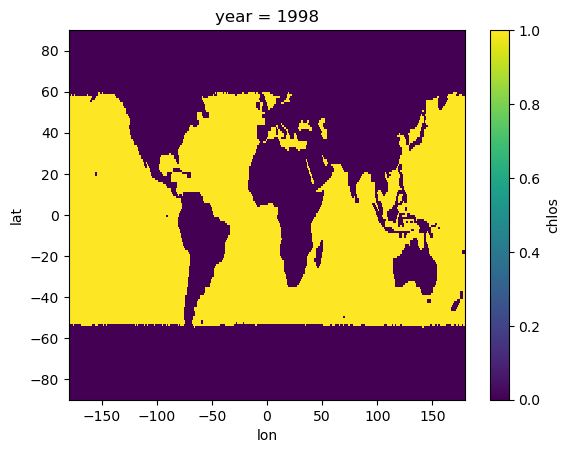

In [39]:
mask_ocean.plot()

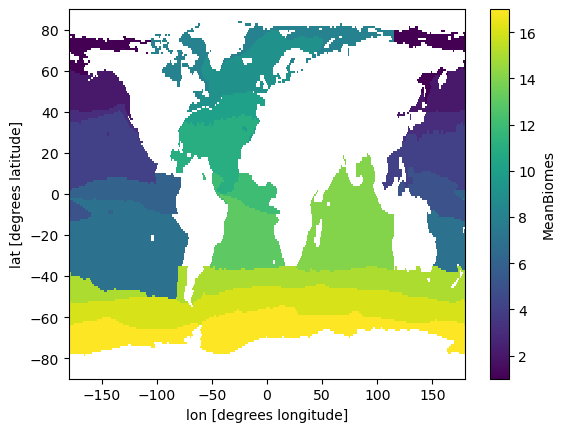

In [41]:
biomes.MeanBiomes.plot()

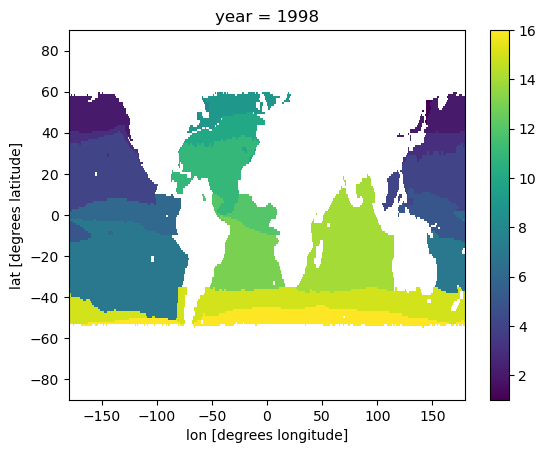

In [42]:
b = (biomes.MeanBiomes * mask_ocean).where(biomes.MeanBiomes * mask_ocean > 0)
b.plot()

# Seasonal Cycle: Climatology and Variance #

In [34]:
ds_list = [
           'obs',
           'asm_em',
           'hnd_em',
           'sim_em'
          ]

dict_color = { 'obs'    : obs_dict['color'],
               'asm_em' : asm_dict['color'],
               'hnd_em' : hnd_dict['color'],
               'sim_em' : sim_dict['color'],
              }


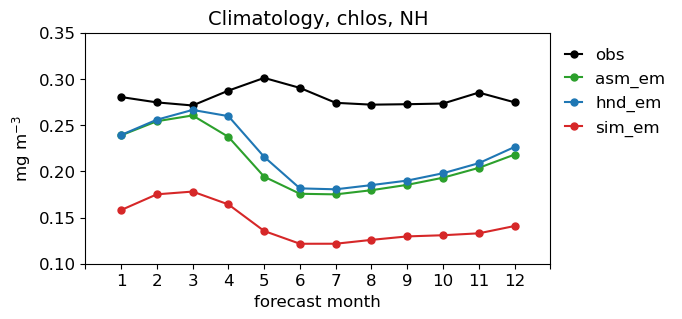

In [35]:


dict_to_show = {}
for ds in ds_list:
    dict_to_show[ds] = dict_clim_glbavg_NH[ds].sel(time=slice(0,11))
   
    
xlim_min = -1
xlim_max = 12
xticks_step = 1
    
file_out = f'ts_seasonal_cycle_climatology_basics'
title = f'Climatology, chlos, NH'
plot_ts_vs_lead(ds_list,        
              dict_to_show,
              color_dict=dict_color,
              ylim_min=0.1,
              ylim_max=0.35,
              xlim_min=xlim_min,
              xlim_max=xlim_max,
              xticks_step=xticks_step,
              xlabel='forecast month',
              ylabel=f'{units}',
              title=title,
              bbox=(.78,.5,.5,.5),
              fontsize=12,              
              dir_name=dir_out,
              file_name=file_out,
              show=True,
              save=True)

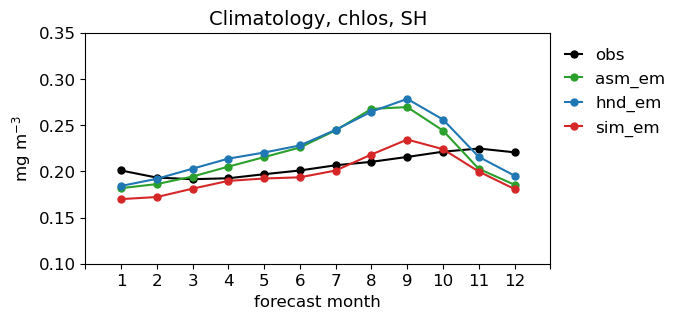

In [36]:
dict_to_show = {}
for ds in ds_list:
    dict_to_show[ds] = dict_clim_glbavg_SH[ds].sel(time=slice(0,11))
   
    
xlim_min = -1
xlim_max = 12
xticks_step = 1
    
file_out = f'ts_seasonal_cycle_climatology_basics'
title = f'Climatology, chlos, SH'
plot_ts_vs_lead(ds_list,        
              dict_to_show,
              color_dict=dict_color,
              ylim_min=0.1,
              ylim_max=0.35,
              xlim_min=xlim_min,
              xlim_max=xlim_max,
              xticks_step=xticks_step,
              xlabel='forecast month',
              ylabel=f'{units}',
              title=title,
              bbox=(.78,.5,.5,.5),
              fontsize=12,              
              dir_name=dir_out,
              file_name=file_out,
              show=True,
              save=True)

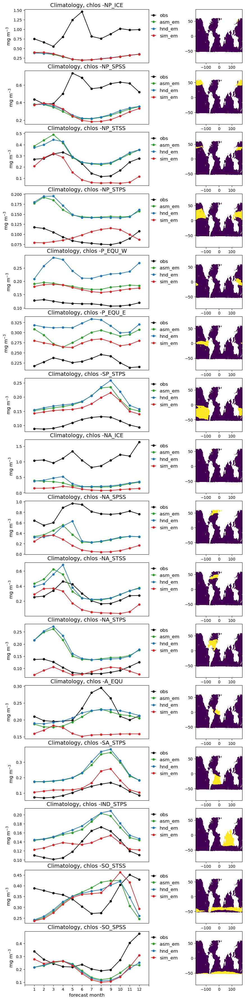

In [37]:
dict_to_show = {}
for bms_label in bms_labels:
    dict_to_show[bms_label] = {}
    for ds in ds_list:
        dict_to_show[bms_label][ds] = dict_clim_avg_biomes[bms_label][ds].sel(time=slice(0,11))
   
    
xlim_min = -1
xlim_max = 12
xticks_step = 1
    
file_out = f'ts_seasonal_cycle_climatology_basics'
title = f'Climatology, chlos '
plot_ts_vs_lead_biomes(ds_list,        
              dict_to_show,
              biomes = biomes.MeanBiomes * mask_ocean.where(mask_ocean>0),
              bms_labels=bms_labels,
              color_dict=dict_color,
              xlim_min=xlim_min,
              xlim_max=xlim_max,
              figsize= (10,45),
              xticks_step=xticks_step,
              xlabel='forecast month',
              ylabel=f'{units}',
              title=title,
              bbox=(.78,.5,.5,.5),
              fontsize=12,              
              dir_name=dir_out,
              file_name=file_out,
              show=True,
              save=True)

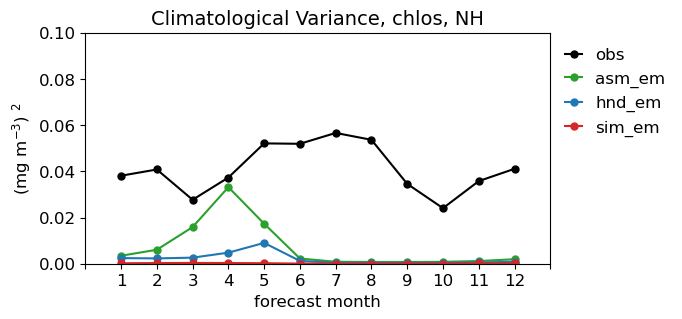

In [38]:
ds_list = [
           'obs',
           'asm_em',
           'hnd_em',
        #    'hnd',
           'sim_em'
          ]

dict_color = { 'obs'    : obs_dict['color'],
               'asm_em' : asm_dict['color'],
               'hnd_em' : hnd_dict['color'],
            #    'hnd'    : "tab:orange",
               'sim_em' : sim_dict['color'],
              }


dict_to_show = {}
for ds in ds_list:
    dict_to_show[ds] = dict_var_glbavg_NH[ds].sel(time=slice(0,11))
xlim_min = -1
xlim_max = 12
xticks_step = 1

file_out = f'ts_seasonal_cycle_climatology_basics'
title = f'Climatological Variance, chlos, NH'
plot_ts_vs_lead(ds_list,        
              dict_to_show,
              color_dict=dict_color,
            #   ylim_min=0.2,
            #   ylim_max=0.55,
              xlim_min=xlim_min,
              xlim_max=xlim_max,
              xticks_step=xticks_step,
              xlabel='forecast month',
              ylabel=f'({units}) $^{2}$',
              title=title,
              bbox=(.78,.5,.5,.5),
              fontsize=12,              
              dir_name=dir_out,
              file_name=file_out,
              show=True,
              save=False)

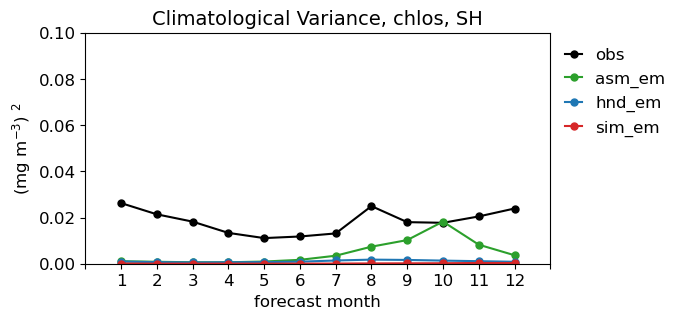

In [39]:
dict_to_show = {}
for ds in ds_list:
    dict_to_show[ds] = dict_var_glbavg_SH[ds].sel(time=slice(0,11))
xlim_min = -1
xlim_max = 12
xticks_step = 1

file_out = f'ts_seasonal_cycle_climatology_basics'
title = f'Climatological Variance, chlos, SH'
plot_ts_vs_lead(ds_list,        
              dict_to_show,
              color_dict=dict_color,
            #   ylim_min=0.2,
            #   ylim_max=0.55,
              xlim_min=xlim_min,
              xlim_max=xlim_max,
              xticks_step=xticks_step,
              xlabel='forecast month',
              ylabel=f'({units}) $^{2}$',
              title=title,
              bbox=(.78,.5,.5,.5),
              fontsize=12,              
              dir_name=dir_out,
              file_name=file_out,
              show=True,
              save=False)

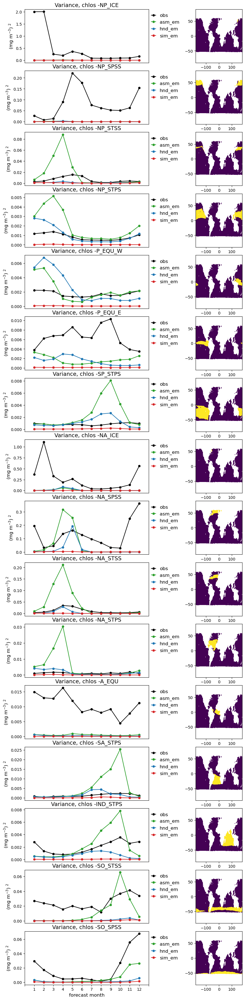

In [40]:
dict_to_show = {}
for bms_label in bms_labels:
    dict_to_show[bms_label] = {}
    for ds in ds_list:
        dict_to_show[bms_label][ds] = dict_var_avg_biomes[bms_label][ds].sel(time=slice(0,11))
   
    
xlim_min = -1
xlim_max = 12
xticks_step = 1
    
file_out = f'ts_seasonal_cycle_var_basics'
title = f'Variance, chlos '
plot_ts_vs_lead_biomes(ds_list,        
              dict_to_show,
              biomes = biomes.MeanBiomes * mask_ocean.where(mask_ocean>0),
              bms_labels=bms_labels,
              color_dict=dict_color,
              xlim_min=xlim_min,
              xlim_max=xlim_max,
              figsize= (10,45),
              xticks_step=xticks_step,
              xlabel='forecast month',
              ylabel=f'({units}) $^{2}$',
              title=title,
              bbox=(.78,.5,.5,.5),
              fontsize=12,              
              dir_name=dir_out,
              file_name=file_out,
              show=True,
              save=True)

# Global Means #

In [41]:

dict_em_ts_NH = { 'obs'     : { 'ts'        : area_weighted_avg(dict_em_data['obs'], H = 'North',mask=mask_ocean,
                                                             integral=False),
                             'color'     : obs_dict['color'],
                             'linestyle' : '-',
                            },
               'asm_em'  : { 'ts'        : area_weighted_avg(dict_em_data['asm_em'],H = 'North',mask=mask_ocean,
                                                             integral=False),
                             'color'     : asm_dict['color'],
                             'linestyle' : '-',
                           },
               'hnd_em' : { 'ts'        : area_weighted_avg(dict_em_data['hnd_em'],H = 'North',mask=mask_ocean,
                                                             integral=False),
                             'color'     : hnd_dict['color'],
                             'linestyle' : '-',
                     },
               'sim_em' : { 'ts'    : area_weighted_avg(dict_em_data['sim_em'],H = 'North',mask=mask_ocean,
                                                             integral=False),
                             'color'     : sim_dict['color'],
                             'linestyle' : '-',
                     },
            }

dict_em_anom_ts_NH = { 'obs'     : { 'ts'        : area_weighted_avg(dict_anom['obs'], H = 'North',mask=mask_ocean,
                                                             integral=False),
                             'color'     : obs_dict['color'],
                             'linestyle' : '-',
                            },
               'asm_em'  : { 'ts'        : area_weighted_avg(dict_anom['asm_em'],H = 'North',mask=mask_ocean,
                                                             integral=False),
                             'color'     : asm_dict['color'],
                             'linestyle' : '-',
                           },
               'hnd_em' : { 'ts'        : area_weighted_avg(dict_anom['hnd_em'],H = 'North',mask=mask_ocean,
                                                             integral=False),
                             'color'     : hnd_dict['color'],
                             'linestyle' : '-',
                     },
               'sim_em' : { 'ts'    : area_weighted_avg(dict_anom['sim_em'],H = 'North',mask=mask_ocean,
                                                             integral=False),
                             'color'     : sim_dict['color'],
                             'linestyle' : '-',
                     },
            }

dict_em_ts_SH = { 'obs'     : { 'ts'        : area_weighted_avg(dict_em_data['obs'], H = 'South',mask=mask_ocean,
                                                             integral=False),
                             'color'     : obs_dict['color'],
                             'linestyle' : '-',
                            },
               'asm_em'  : { 'ts'        : area_weighted_avg(dict_em_data['asm_em'],H = 'South',mask=mask_ocean,
                                                             integral=False),
                             'color'     : asm_dict['color'],
                             'linestyle' : '-',
                           },
               'hnd_em' : { 'ts'        : area_weighted_avg(dict_em_data['hnd_em'],H = 'South',mask=mask_ocean,
                                                             integral=False),
                             'color'     : hnd_dict['color'],
                             'linestyle' : '-',
                     },
               'sim_em' : { 'ts'    : area_weighted_avg(dict_em_data['sim_em'],H = 'South',mask=mask_ocean,
                                                             integral=False),
                             'color'     : sim_dict['color'],
                             'linestyle' : '-',
                     },
            }

dict_em_anom_ts_SH = { 'obs'     : { 'ts'        : area_weighted_avg(dict_anom['obs'], H = 'South',mask=mask_ocean,
                                                             integral=False),
                             'color'     : obs_dict['color'],
                             'linestyle' : '-',
                            },
               'asm_em'  : { 'ts'        : area_weighted_avg(dict_anom['asm_em'],H = 'South',mask=mask_ocean,
                                                             integral=False),
                             'color'     : asm_dict['color'],
                             'linestyle' : '-',
                           },
               'hnd_em' : { 'ts'        : area_weighted_avg(dict_anom['hnd_em'],H = 'South',mask=mask_ocean,
                                                             integral=False),
                             'color'     : hnd_dict['color'],
                             'linestyle' : '-',
                     },
               'sim_em' : { 'ts'    : area_weighted_avg(dict_anom['sim_em'],H = 'South',mask=mask_ocean,
                                                             integral=False),
                             'color'     : sim_dict['color'],
                             'linestyle' : '-',
                     },
            }


In [42]:
dict_em_ts_biomes = {}

for ii, bms_label in enumerate(bms_labels):
        
        biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
        biome =spatial_mask(biome.to_dataset()) * mask_ocean
               
        dict_em_ts_biomes[bms_label] = { 'obs'     : { 'ts'        : area_weighted_avg(dict_em_data['obs'], mask=biome,
                                                                integral=False),
                                'color'     : obs_dict['color'],
                                'linestyle' : '-',
                                },
                'asm_em'  : { 'ts'        : area_weighted_avg(dict_em_data['asm_em'], mask=biome,
                                                                integral=False),
                                'color'     : asm_dict['color'],
                                'linestyle' : '-',
                                },
                'hnd_em' : { 'ts'        : area_weighted_avg(dict_em_data['hnd_em'], mask=biome,
                                                                integral=False),
                                'color'     : hnd_dict['color'],
                                'linestyle' : '-',
                        },
                'sim_em' : { 'ts'    : area_weighted_avg(dict_em_data['sim_em'], mask=biome,
                                                                integral=False),
                                'color'     : sim_dict['color'],
                                'linestyle' : '-',
                        },
                }

dict_em_anom_ts_biomes = {}

for ii, bms_label in enumerate(bms_labels):
        
        biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
        biome =spatial_mask(biome.to_dataset()) * mask_ocean
        dict_em_anom_ts_biomes[bms_label] = { 'obs'     : { 'ts'        : area_weighted_avg(dict_anom['obs'],  mask=biome,
                                                                integral=False),
                                'color'     : obs_dict['color'],
                                'linestyle' : '-',
                                },
                'asm_em'  : { 'ts'        : area_weighted_avg(dict_anom['asm_em'], mask=biome,
                                                                integral=False),
                                'color'     : asm_dict['color'],
                                'linestyle' : '-',
                                },
                'hnd_em' : { 'ts'        : area_weighted_avg(dict_anom['hnd_em'], mask=biome,
                                                                integral=False),
                                'color'     : hnd_dict['color'],
                                'linestyle' : '-',
                        },
                'sim_em' : { 'ts'    : area_weighted_avg(dict_anom['sim_em'], mask=biome,
                                                                integral=False),
                                'color'     : sim_dict['color'],
                                'linestyle' : '-',
                        },
                }

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


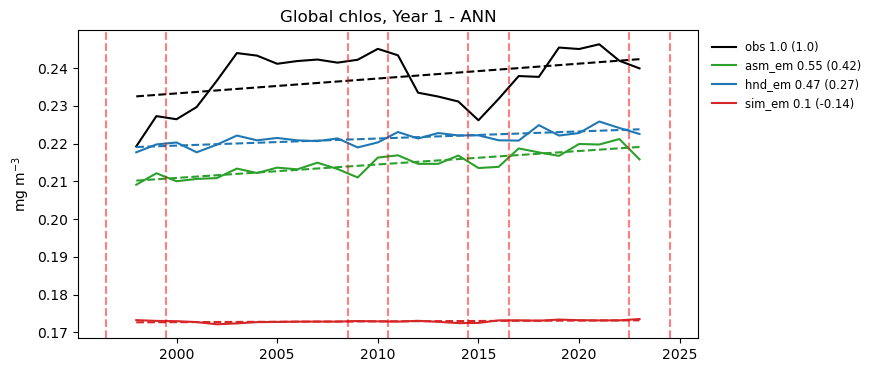

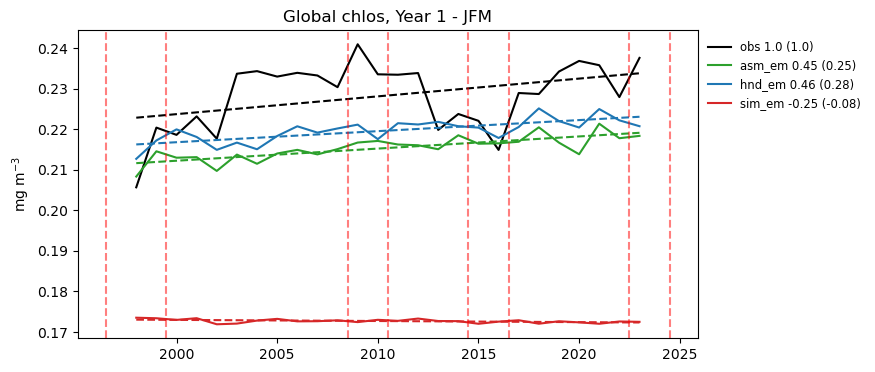

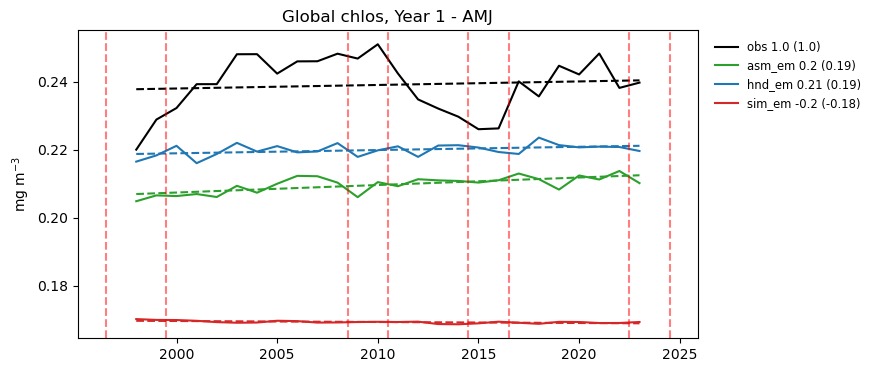

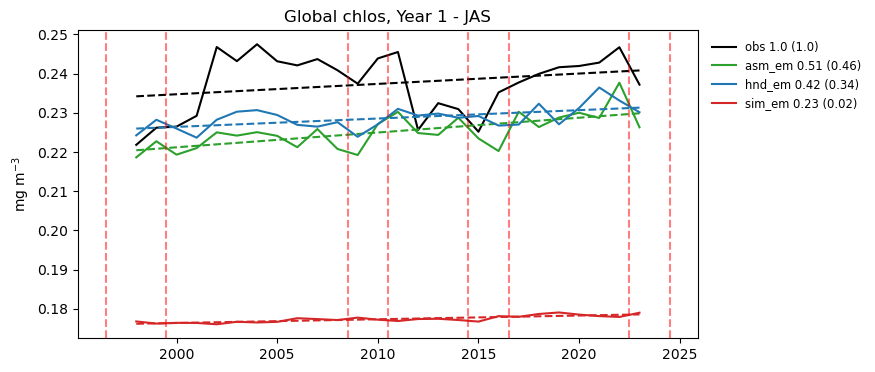

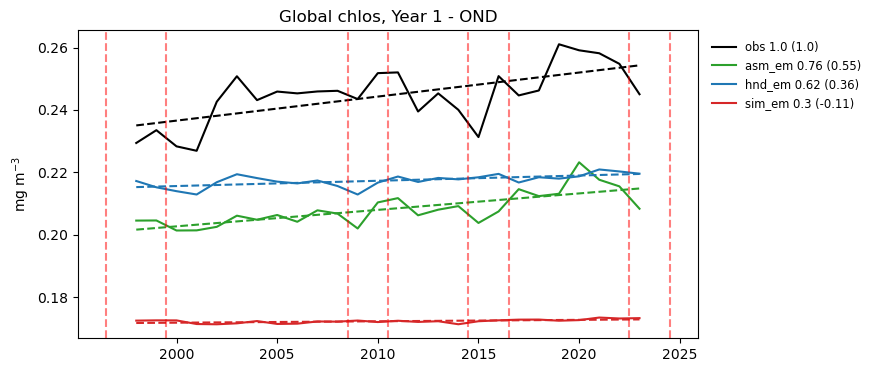

In [43]:
dict_em_ts = { 'obs'     : { 'ts'        : area_weighted_avg(dict_em_data['obs'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : obs_dict['color'],
                             'linestyle' : '-',
                             
                            },
               'asm_em'  : { 'ts'        : area_weighted_avg(dict_em_data['asm_em'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : asm_dict['color'],
                             'linestyle' : '-',
                           },
               'hnd_em' : { 'ts'        : area_weighted_avg(dict_em_data['hnd_em'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : hnd_dict['color'],
                             'linestyle' : '-',
                     },
               'sim_em' : { 'ts'    : area_weighted_avg(dict_em_data['sim_em'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : sim_dict['color'],
                             'linestyle' : '-',
                     },
            }


nldyr = 1 

for season in ['ANN','JFM','AMJ','JAS','OND']:
  for ildyr in np.arange(nldyr):
      file_out = f'ts_glb_total_at_{ildyr+1}-year_lead'
      title = f'Global chlos, Year {ildyr+1} - {season}'
      plot_ts_glbavg_on_target([
                                    'obs',
                                    'asm_em',
                                    'hnd_em',
                                    'sim_em'
                                    ],
                                  dict_em_ts,
                                  ldyr=ildyr,
                                  figsize=(8,4),
                                  bbox=(.78,.5,.5,.5),
                                  title=title,
                                  dir_name=dir_out,
                                  file_name=file_out,
                                  ylabel = units,
                                  Correlations = True,
                                  season  =season,
                                  Trend = True,
                                  show=True,
                                  save=False)        

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]


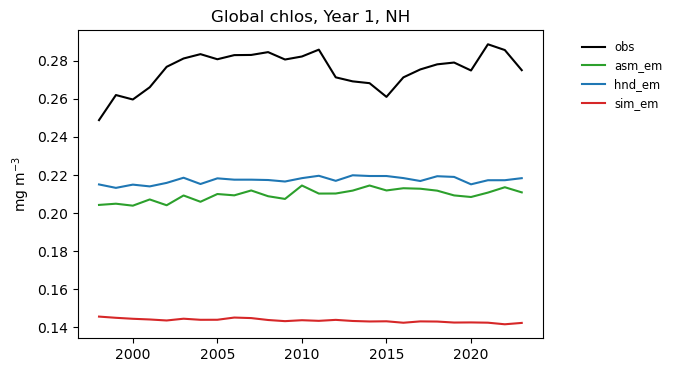

In [41]:
nldyr = 1 
for ildyr in np.arange(nldyr):
    file_out = f'ts_glb_total_at_{ildyr+1}-year_lead'
    title = f'Global chlos, Year {ildyr+1}, NH'
    plot_ts_glbavg_on_target([
                                   'obs',
                                   'asm_em',
                                   'hnd_em',
                                   'sim_em'
                                  ],
                                dict_em_ts_NH,
                                ldyr=ildyr,
                                figsize=(6,4),
                                bbox=(.78,.5,.5,.5),
                                title=title,
                                dir_name=dir_out,
                                file_name=file_out,
                                ylabel = units,
                                show=True,
                                save=False)        
  

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]


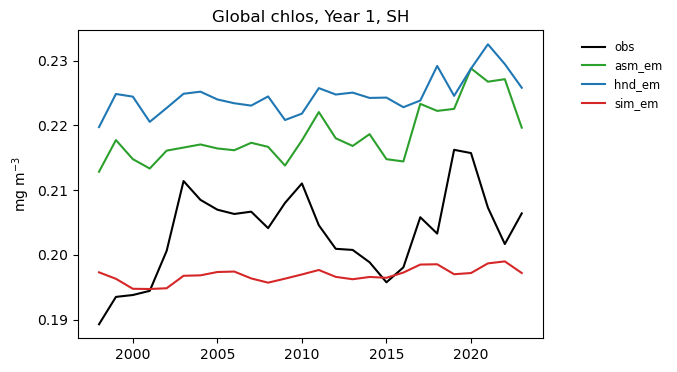

In [42]:
nldyr = 1 
for ildyr in np.arange(nldyr):
    file_out = f'ts_glb_total_at_{ildyr+1}-year_lead'
    title = f'Global chlos, Year {ildyr+1}, SH'
    plot_ts_glbavg_on_target([
                                   'obs',
                                   'asm_em',
                                   'hnd_em',
                                   'sim_em'
                                  ],
                                dict_em_ts_SH,
                                ldyr=ildyr,
                                figsize=(6,4),
                                bbox=(.78,.5,.5,.5),
                                title=title,
                                dir_name=dir_out,
                                file_name=file_out,
                                ylabel = units,
                                show=True,
                                save=False)        

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


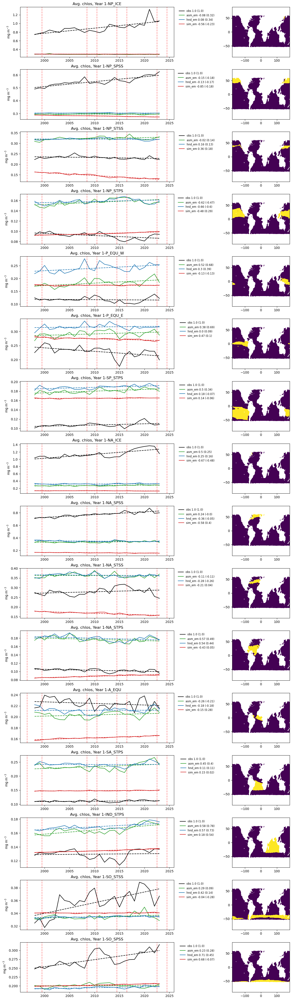

In [53]:
nldyr = 1 
for ildyr in np.arange(nldyr):
    file_out = f'ts_glb_total_at_{ildyr+1}-year_lead'
    title = f'Avg. chlos, Year {ildyr+1}'
    plot_ts_biomeavg_on_target([
                                   'obs',
                                   'asm_em',
                                   'hnd_em',
                                   'sim_em'
                                  ],
                                dict_em_ts_biomes,
                                bms_labels,
                                biomes = biomes.MeanBiomes * mask_ocean.where(mask_ocean>0), 
                                ldyr=ildyr,
                                figsize=(15,55),
                                bbox=(.78,.5,.5,.5),
                                title=title,
                                dir_name=dir_out,
                                file_name=file_out,
                                ylabel = units,
                                ENSO = True,
                                Correlations = True,
                                Trend  = True,
                                show=True,
                                save=False)        

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


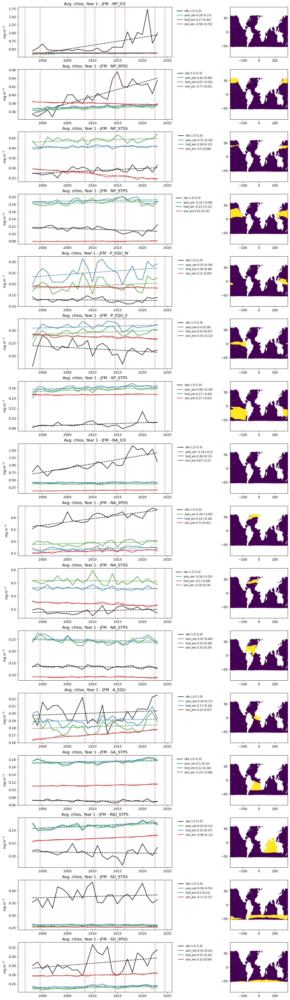

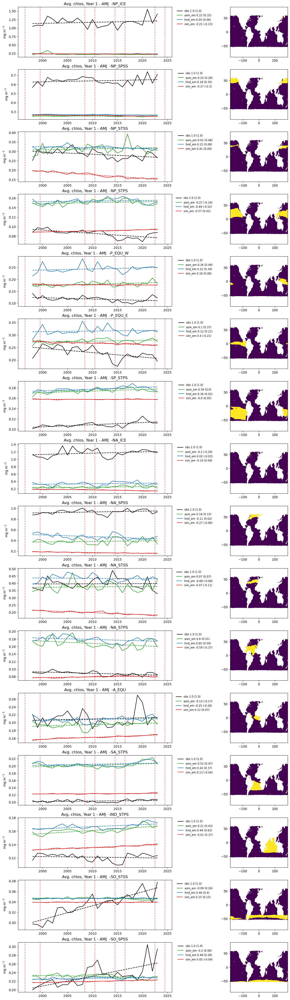

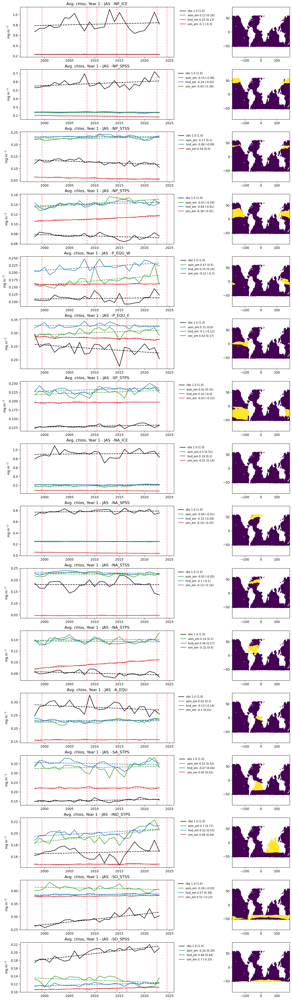

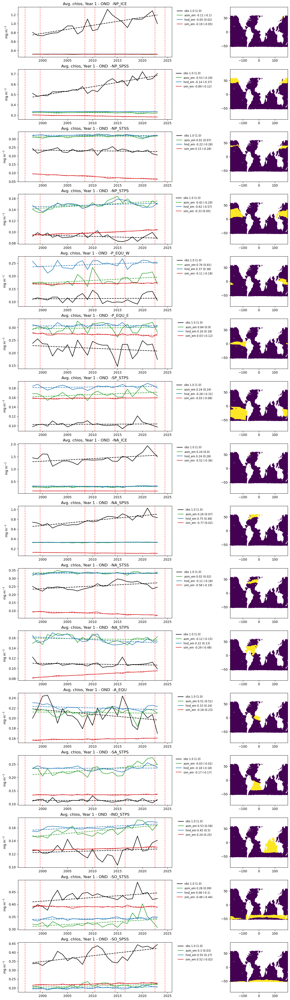

In [54]:
nldyr = 1 

for season in ['JFM','AMJ','JAS', 'OND']:
    file_out = f'ts_glb_total_at_{ildyr+1}-year_lead_{season}'
    title = f'Avg. chlos, Year {ildyr+1} - {season}  '
    plot_ts_biomeavg_on_target([
                                   'obs',
                                   'asm_em',
                                   'hnd_em',
                                   'sim_em'
                                  ],
                                dict_em_ts_biomes,
                                bms_labels,
                                biomes = biomes.MeanBiomes * mask_ocean.where(mask_ocean>0), 
                                ldyr=ildyr,
                                figsize=(15,55),
                                bbox=(.78,.5,.5,.5),
                                title=title, 
                                dir_name=dir_out,
                                file_name=file_out,
                                ylabel = units,
                                season = season,
                                Trend = True,
                                Correlations = True,
                                show=True,
                                save=False)        

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]


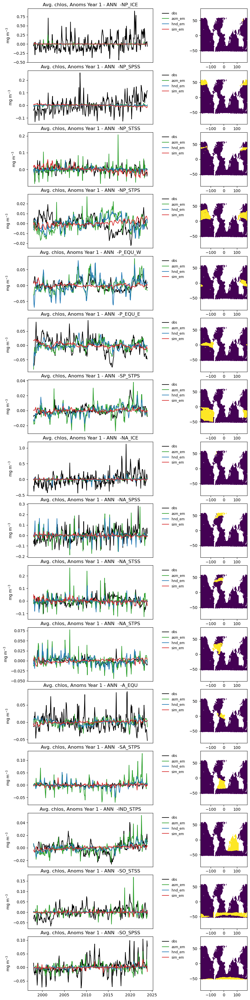

: 

In [57]:
nldyr = 1 
ildyr = 0
for season in ['ANN']:
    file_out = f'ts_glb_total_at_{ildyr+1}-year_lead_{season}'
    title = f'Avg. chlos, Anoms Year {ildyr+1} - {season}  '
    plot_ts_biomeavg_on_target([
                                   'obs',
                                   'asm_em',
                                   'hnd_em',
                                   'sim_em'
                                  ],
                                dict_em_anom_ts_biomes,
                                bms_labels,
                                biomes = biomes.MeanBiomes * mask_ocean.where(mask_ocean>0), 
                                ldyr=ildyr,
                                figsize=(10,45),
                                bbox=(.78,.5,.5,.5),
                                title=title,
                                dir_name=dir_out,
                                file_name=file_out,
                                annual_mean  =False,
                                ylabel = units,
                                season = season,
                                show=True,
                                save=False)        

# Anomalies #

init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


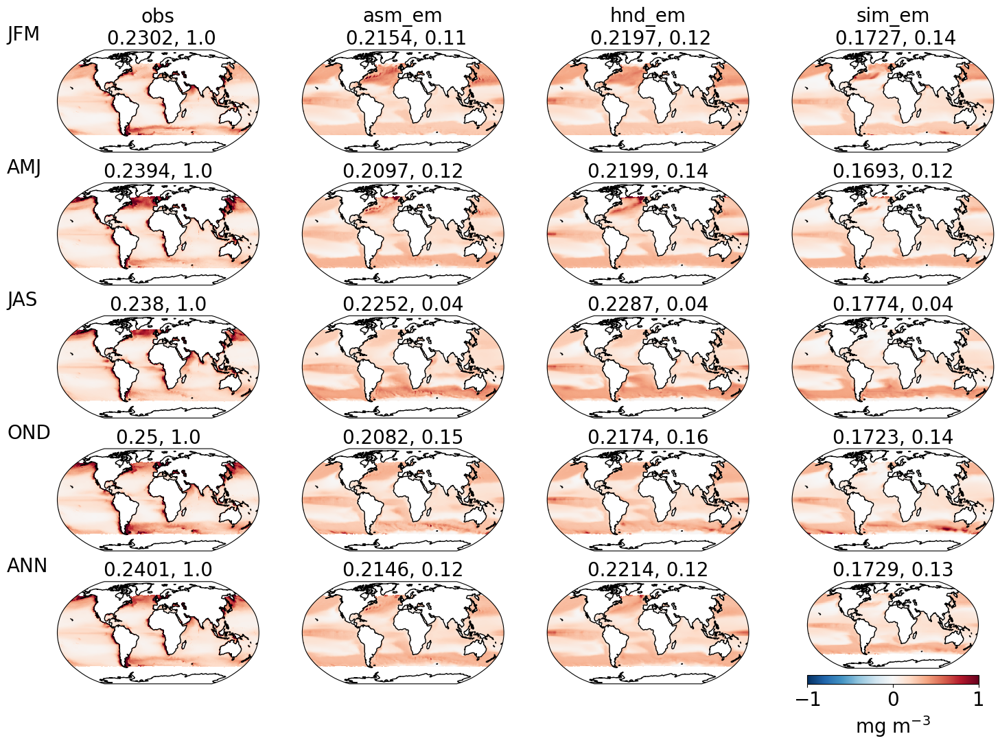

In [55]:
show = True

dict_to_show = { 
                    'obs'    : ddata_em_after['obs'].sel(year=slice(y0_show,
                                                               y1_show)),
                    'asm_em' : ddata_em_after['asm_em'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'hnd_em' : ddata_em_after['hnd_em'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'sim_em' : ddata_em_after['sim_em'].sel(year=slice(y0_show,
                                                                  y1_show))
               }

ldyr_ini=1-1
ldyr_end=2-1
file_out = f'Maps_base_{y0_base}-{y1_base}_ldyr_{ldyr_ini}-{ldyr_end}_{y0_show}-{y1_show}'

if show:
    plot_composites([
                                   'obs',
                                   'asm_em',
                                   'hnd_em',
                                   'sim_em'
                ],
                dict_to_show,     
                figsize=(18,12),           
                central_longitude=0,
                ldyr_ini=ldyr_ini,
                ldyr_end=ldyr_end,
                vmax=1,
                vmin=-1,
                dir_name=dir_out,
                file_name=file_out,
                save=False,
                 mask = mask_ocean,
                 cbar_label = units)

init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


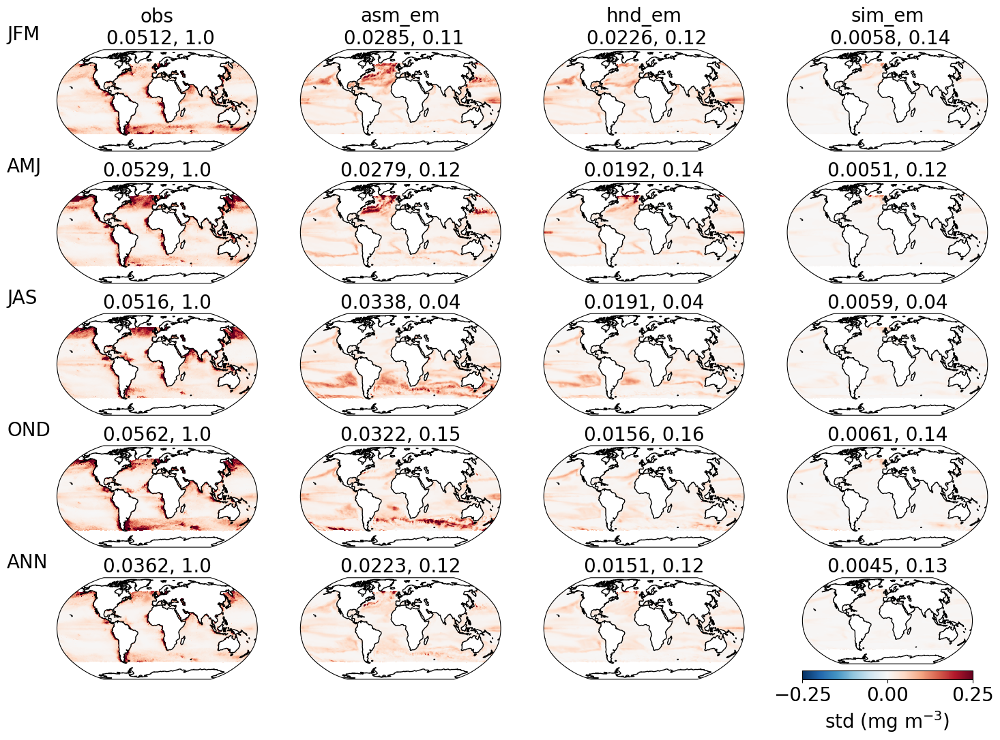

In [56]:
show = True

dict_to_show = { 
                    'obs'    : dict_em_data['obs'].sel(year=slice(y0_show,
                                                               y1_show)),
                    'asm_em' : dict_em_data['asm_em'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'hnd_em' : dict_em_data['hnd_em'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'sim_em' : dict_em_data['sim_em'].sel(year=slice(y0_show,
                                                                  y1_show))
               }

ldyr_ini=1-1
ldyr_end=2-1
file_out = f'Maps_std_{y0_base}-{y1_base}_ldyr_{ldyr_ini}-{ldyr_end}_{y0_show}-{y1_show}'

if show:
    plot_composites([
                                   'obs',
                                   'asm_em',
                                   'hnd_em',
                                   'sim_em'
                ],
                dict_to_show,     
                figsize=(18,12),           
                central_longitude=0,
                ldyr_ini=ldyr_ini,
                ldyr_end=ldyr_end,
                vmax=.25,
                vmin=-0.25,
                dir_name=dir_out,
                file_name=file_out,
                save=False,
                std = True,
                annual_mean = True,
                 mask = mask_ocean,
                 cbar_label = units)

## Skill Measures ##

In [57]:

dict_plt_meas = { 
                  'corr' : { 'vmin' : -1.,
                             'vmax' : 1.,
                             'label': 'correlation',
                             'cmap' : 'RdBu_r'
                           },
                'corr_det' : { 'vmin' : -1.,
                             'vmax' : 1.,
                             'label': 'correlation',
                             'cmap' : 'RdBu_r'
                           },
                  'rmse' : { 'vmin' : 0,
                             'vmax' : 0.2,
                             'label': 'rmse (mg m$^{-3}$)',
                             'cmap' : 'Reds_r'
                           },
                  'bias' : { 'vmin' : -0.35,
                             'vmax' : 0.35,
                             'label': 'diff with obs (mg m$^{-3}$)',
                             'cmap' : 'RdBu_r'
                           },
                  'MSSS' : { 'vmin' : -100,
                             'vmax' : 1,
                             'label': 'MSSS',
                             'cmap' : 'Reds_r'
                           },
                }

dict_to_show = { 'full' : { 
                            'obs'    : dict_em_data['obs'].sel(year=slice(y0_show,
                                                                          y1_show)),
                            'asm_em' : dict_em_data['asm_em'].sel(year=slice(y0_show,
                                                                             y1_show)),
                            'hnd_em': dict_em_data['hnd_em'].sel(year=slice(y0_show,
                                                                            y1_show)),
                            'sim_em' : dict_em_data['sim_em'].sel(year=slice(y0_show,
                                                                             y1_show)),
                          },
                 'anom' : { 
                            'obs'    : dict_anom['obs'].sel(year=slice(y0_show,
                                                                       y1_show)),
                            'asm_em' : dict_anom['asm_em'].sel(year=slice(y0_show,
                                                                          y1_show)),
                            'hnd_em' : dict_anom['hnd_em'].sel(year=slice(y0_show,
                                                                          y1_show)),
                            'sim_em' : dict_anom['sim_em'].sel(year=slice(y0_show,
                                                                          y1_show)),
                          },
               }



init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


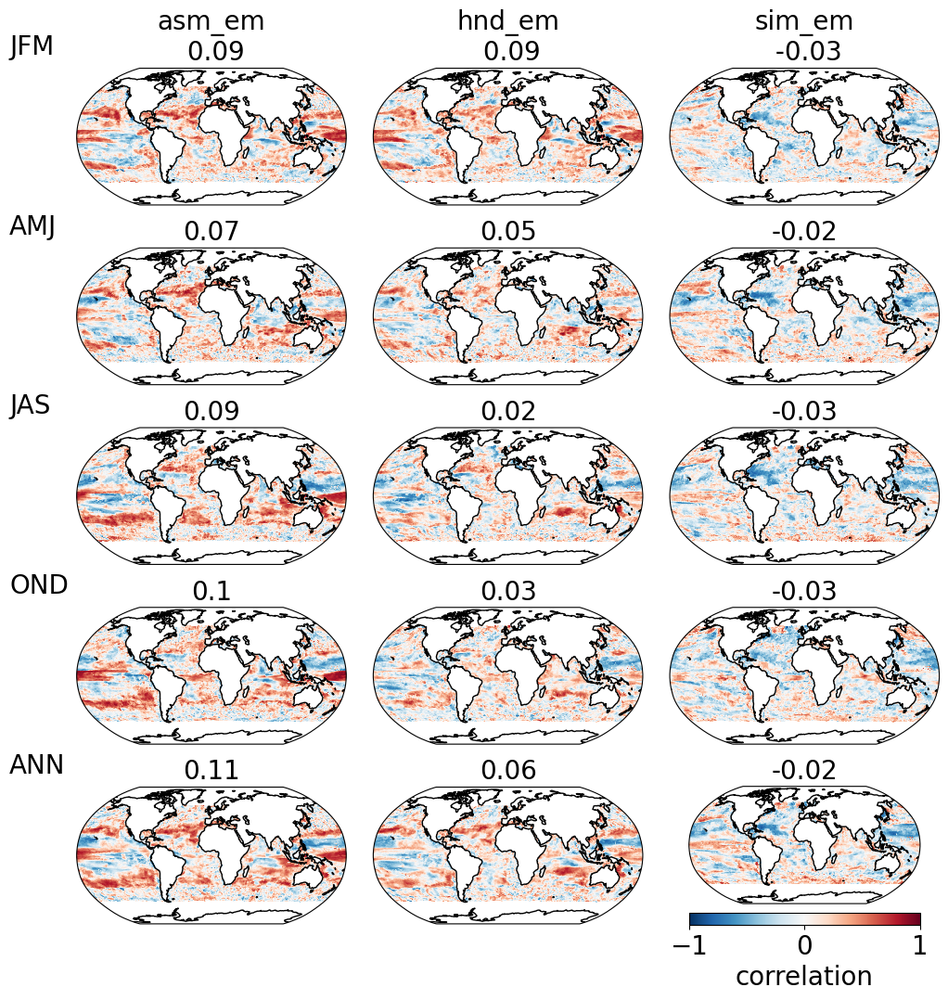

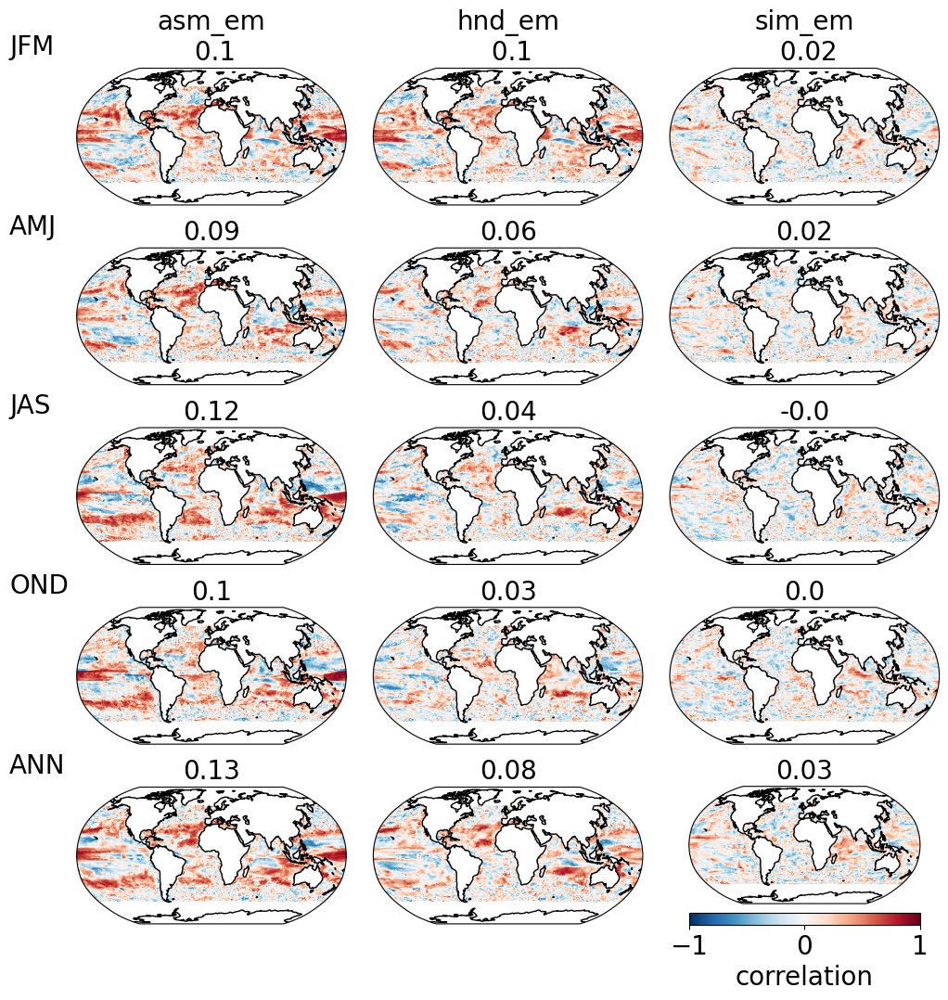

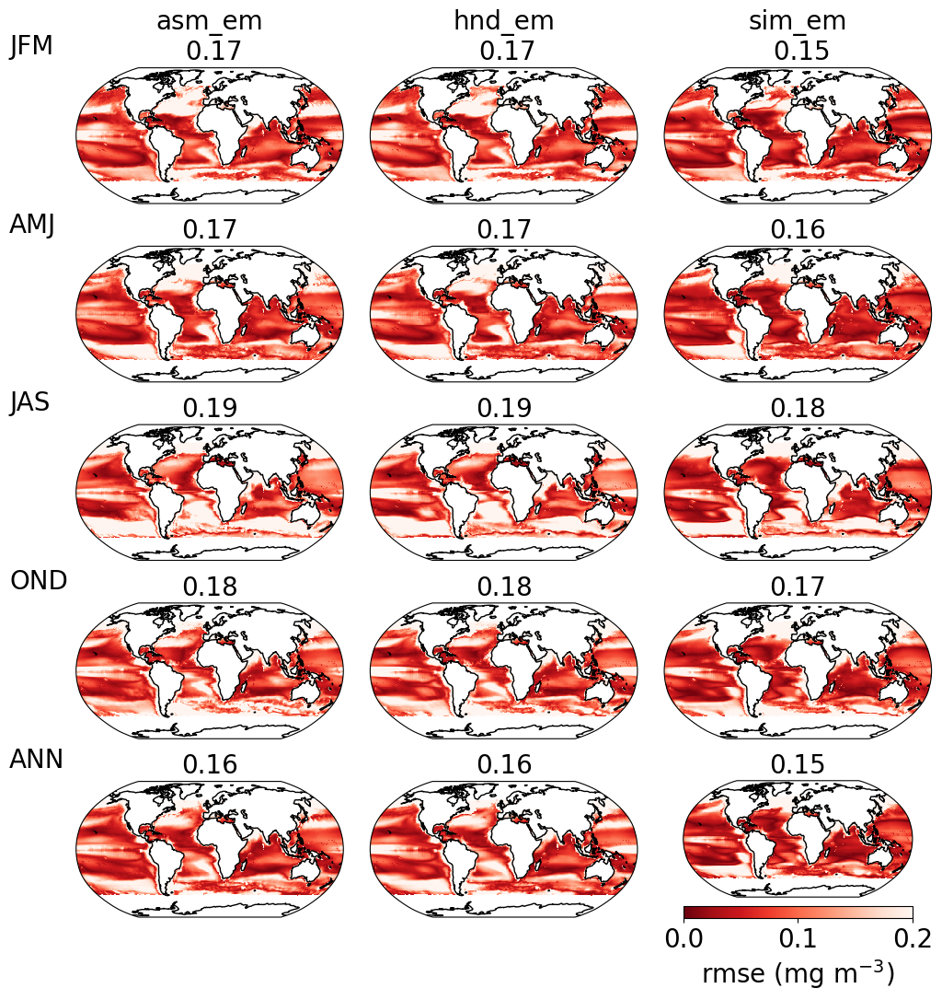

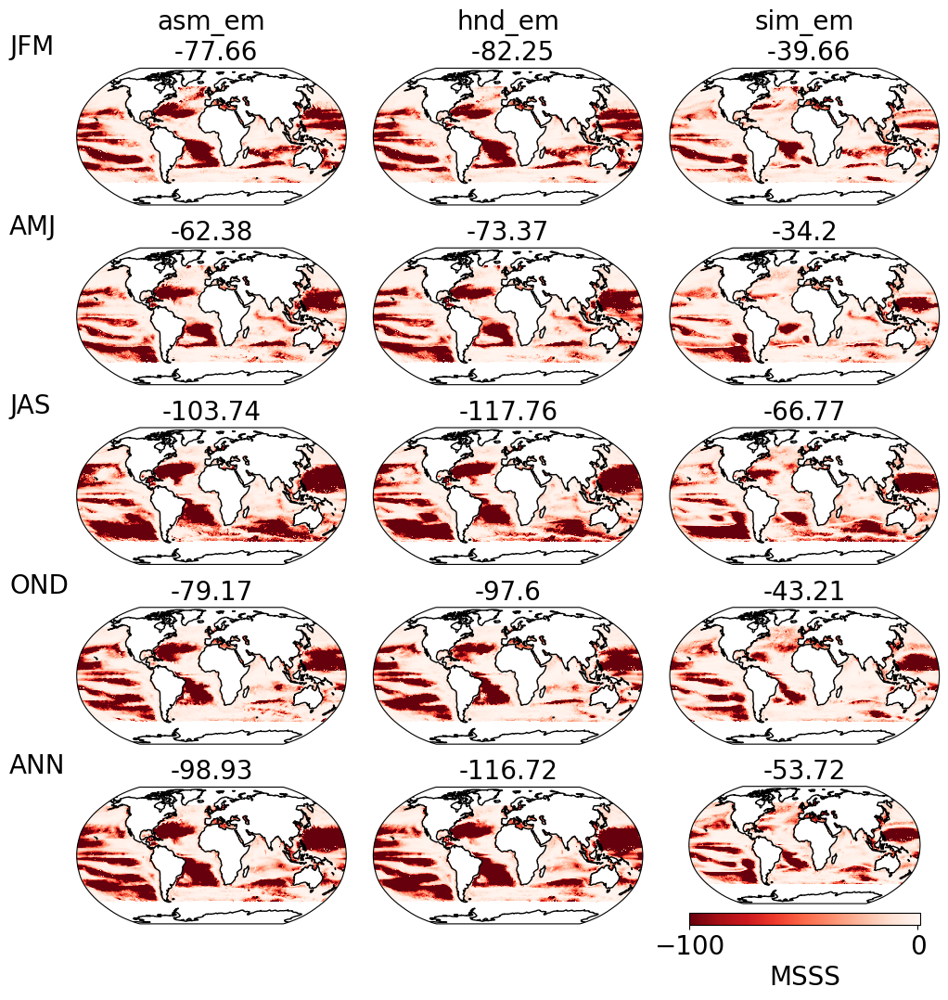

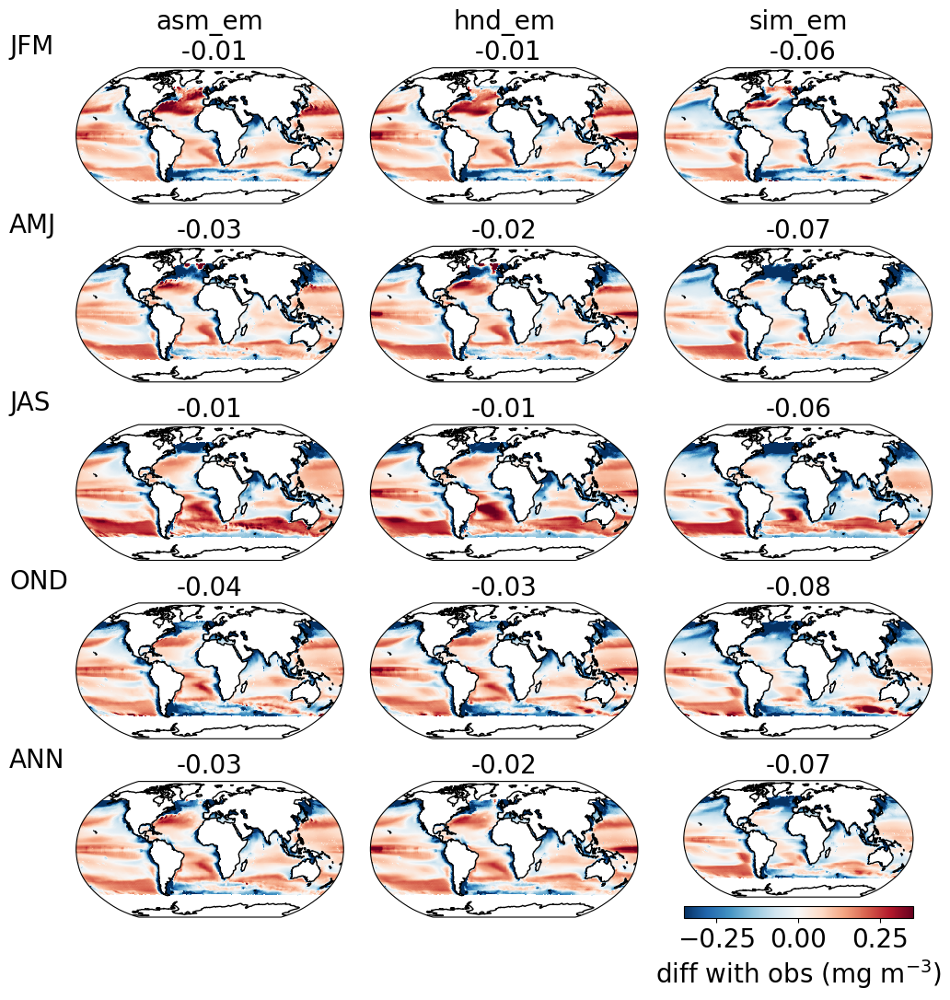

In [58]:
stype = 'full'

show = True


list_measures = [
                'corr',
                'corr_det',
                'rmse',
                'MSSS',
                'bias'
                 ]

if show:
    for ind, measure in enumerate(list_measures):
        ldyr_ini=1-1
        ldyr_end=2-1
        file_out = f'Maps_{list_measures[ind]}_{stype}_ldyr_{ldyr_ini}-{ldyr_end}_{y0_show}-{y1_show}'
        plot_measures([
                                   'asm_em',
                                   'hnd_em',
                                   'sim_em'
                      ],
                    dict_to_show[stype],                
                    measure=measure,
                    central_longitude=0,
                    ldyr_ini=ldyr_ini,
                    ldyr_end=ldyr_end,
                    vmin=dict_plt_meas[measure]['vmin'],
                    vmax=dict_plt_meas[measure]['vmax'],
                    label=dict_plt_meas[measure]['label'],
                    cmap=dict_plt_meas[measure]['cmap'],
                    dir_name=dir_out,
                    file_name=file_out,
                    mask = mask_ocean,
                    save=False)    

# Skill per biome #

In [59]:
list_ds = [
           'obs',
            'hnd_em',
            'asm_em',
            'sim_em'
           ]   
list_ds_type = [
               'full',
               ]

dict_am = {}
dict_am_measures = {}
for ds in list_ds:
    dict_am[ds] = {}
    dict_am_measures[ds] = {}
    for ds_type in list_ds_type:
        dict_am[ds][ds_type] = {} 
        if ds_type == 'full':
            data_ds_type = dict_em_data[ds] 
            dict_am[ds][ds_type] = write_monthly_to_annual(data_ds_type).sel(year=slice(y0_show,
                                                                                    y1_show))
        if ds_type == 'anom':
            data_ds_type = dict_anom[ds] 
            dict_am[ds][ds_type] = write_monthly_to_annual(data_ds_type.sel(year=slice(y0_show,
                                                                                    y1_show)), annual_mean=False)


        dict_am_measures[ds][ds_type] = {} 
        dict_am_measures[ds][ds_type]['corr'] = xr.corr(dict_am['obs'][ds_type],
                                                dict_am[ds][ds_type], dim = 'year')
        dict_am_measures[ds][ds_type]['rmse'] = rmse(dict_am['obs'][ds_type],
                                                dict_am[ds][ds_type])

In [60]:
ds_list = [
           'obs',
            'hnd_em',
            'asm_em',
            'sim_em'
          ]

dict_meas_biomes = {}

for ii,bm_label in enumerate(bms_labels):

    dict_meas_biomes[bm_label] = {}

    biome = biomes.MeanBiomes.where(biomes.CoreBiomes == ii+1)
    biome =spatial_mask(biome.to_dataset()) * mask_ocean
    
    for ds_type in ['full']:
        
        dict_meas_biomes[bm_label][ds_type] = {} 

        for ds_meas in ['corr','rmse']:
            
            dict_meas_biomes[bm_label][ds_type][ds_meas] = {} 
                
            for ds in ds_list:
                
                dict_meas_biomes[bm_label][ds_type][ds_meas][ds] = {} 
        
                values = area_weighted_avg(dict_am_measures[ds][ds_type][ds_meas],
                                          mask=biome).values
                
                dict_meas_biomes[bm_label][ds_type][ds_meas][ds] = values

In [61]:
dict_plot_meas = { 'rmse'         : { 
                                      'title'     : '(a)',
                                      'ylabel'    : f'RMSE', # ({units})',
                                      'bbox'      : (.49,.5,.5,.5),
                                      'ylim_min'  : 0.,
                                      'ylim_max'  : 2.3,
                                      'show_leg'  : False,
                                      'show_hline': False    
                                    },                 
                   'corr'         : {
                                      'title'     : '(b)',
                                      'ylabel'    : 'ACC',
                                      'ylim_min'  : -.19,
                                      'ylim_max'  : .8,
                                      'bbox'      : (.06,.5,.5,.5),
                                      'show_leg'  : False,
                                      'show_hline': True   
                                    },
                 }

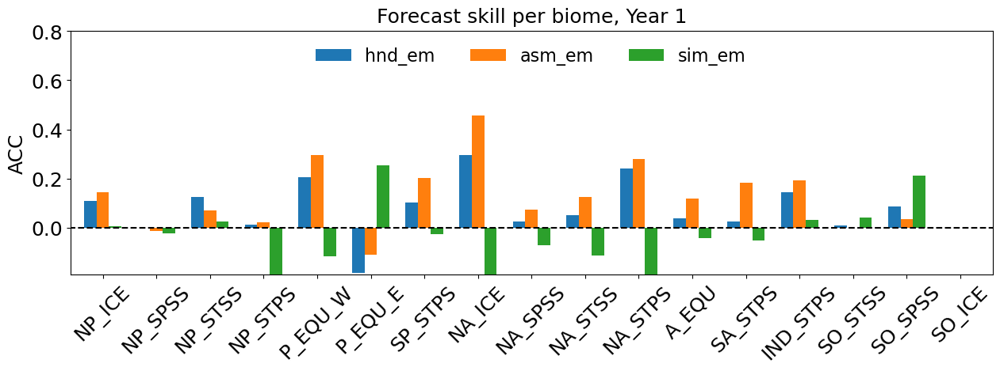

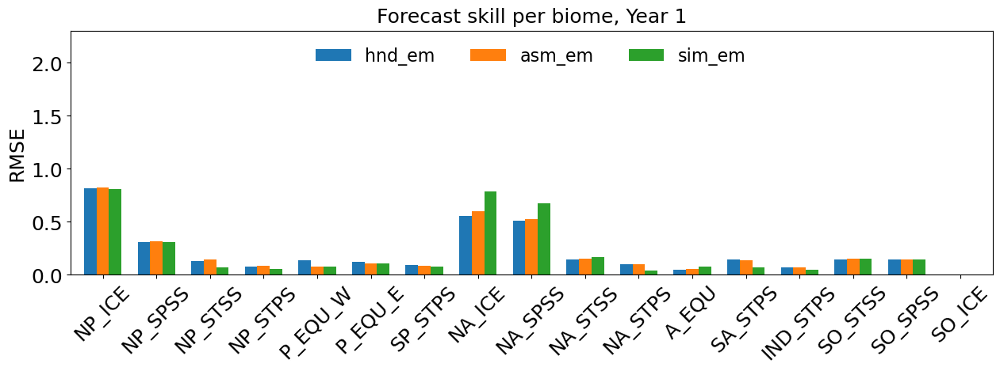

In [62]:
ds_list = [
            'hnd_em',
            'asm_em',
            'sim_em'
          ]

ds_type = 'full'
nld = 1

for meas in [
             'corr',
             'rmse'
            ]:

    dict_data_to_plot = {}
    for ild in np.arange(nld):
        dict_data_to_plot[ild] = {}
        for ds in ds_list:
            dict_data_to_plot[ild][ds] = {}
            for bm_label in bms_labels:
                dict_data_to_plot[ild][ds][bm_label] = {}
                dict_data_to_plot[ild][ds][bm_label] = dict_meas_biomes[bm_label][ds_type][meas][ds][ild]

    for ild in np.arange(nld):
        
        # file_out = f'Barplots_biomes_{meas}_year-{ild+1}_{nadj_name}'
        plot_bars(dict_data_to_plot[ild],
                  title=f'Forecast skill per biome, Year {ild+1}',
                  ylabel=dict_plot_meas[meas]['ylabel'],
                  ylim=(dict_plot_meas[meas]['ylim_min'],
                        dict_plot_meas[meas]['ylim_max']),
                  show_hline=dict_plot_meas[meas]['show_hline'],
                  ncol=3,
                  figsize=(15, 4),
                  leg=True,
                  dir_name=dir_out,
                #   file_name=file_out,
                  show=True,
                  save=False)            

In [232]:
list_ds = [
           'obs',
            'hnd_em',
            'asm_em',
            'sim_em'
           ]   
list_ds_type = [
               'full',
               ]


dict_am_measures_seasons = {}
for season in ['JFM','AMJ','JAS', 'OND', 'ANN']:
    dict_am = {}
    dict_am_measures = {}
    for ds in list_ds:
        dict_am[ds] = {}
        dict_am_measures[ds] = {}
        for ds_type in list_ds_type:
            dict_am[ds][ds_type] = {} 
            if ds_type == 'full':
                data_ds_type = dict_em_data[ds] 
                dict_am[ds][ds_type] = write_monthly_to_annual(data_ds_type, season = season).sel(year=slice(y0_show,
                                                                                        y1_show))
            if ds_type == 'anom':
                data_ds_type = dict_anom[ds] 
                dict_am[ds][ds_type] = write_monthly_to_annual(data_ds_type.sel(year=slice(y0_show,
                                                                                        y1_show)), annual_mean=False, season = season)


            dict_am_measures[ds][ds_type] = {} 
            dict_am_measures[ds][ds_type]['corr'] = xr.corr(dict_am['obs'][ds_type],
                                                    dict_am[ds][ds_type], dim = 'year')
            dict_am_measures[ds][ds_type]['rmse'] = rmse(dict_am['obs'][ds_type],
                                                    dict_am[ds][ds_type])
    dict_am_measures_seasons[season] = dict_am_measures

In [214]:
ds_list = [
           'obs',
            'hnd_em',
            'asm_em',
            'sim_em'
          ]

dict_meas_biomes_seasons = {}
for season in ['JFM','AMJ','JAS', 'OND']:
    dict_meas_biomes = {}

    for ii,bm_label in enumerate(bms_labels):

        dict_meas_biomes[bm_label] = {}

        biome = biomes.MeanBiomes.where(biomes.CoreBiomes == ii+1)
        biome =spatial_mask(biome.to_dataset()) * mask_ocean
        
        for ds_type in ['full']:
            
            dict_meas_biomes[bm_label][ds_type] = {} 

            for ds_meas in ['corr','rmse']:
                
                dict_meas_biomes[bm_label][ds_type][ds_meas] = {} 
                    
                for ds in ds_list:
                    
                    dict_meas_biomes[bm_label][ds_type][ds_meas][ds] = {} 
            
                    values = area_weighted_avg(dict_am_measures_seasons[season][ds][ds_type][ds_meas],
                                            mask=biome).values
                    
                    dict_meas_biomes[bm_label][ds_type][ds_meas][ds] = values
    dict_meas_biomes_seasons[season] = dict_meas_biomes

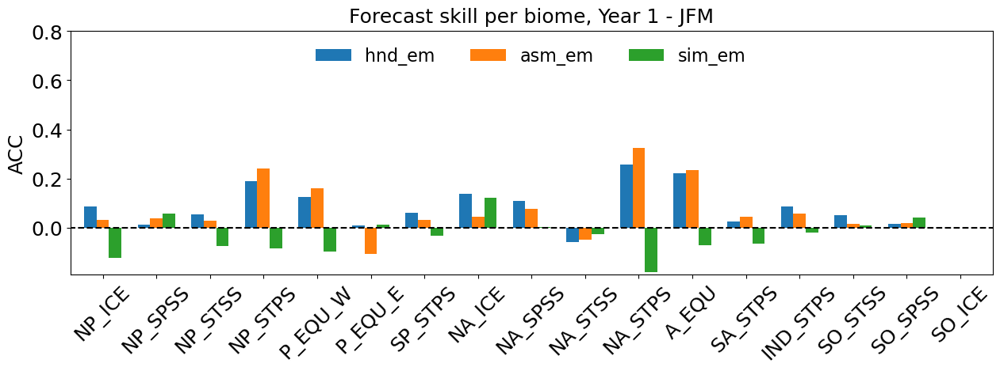

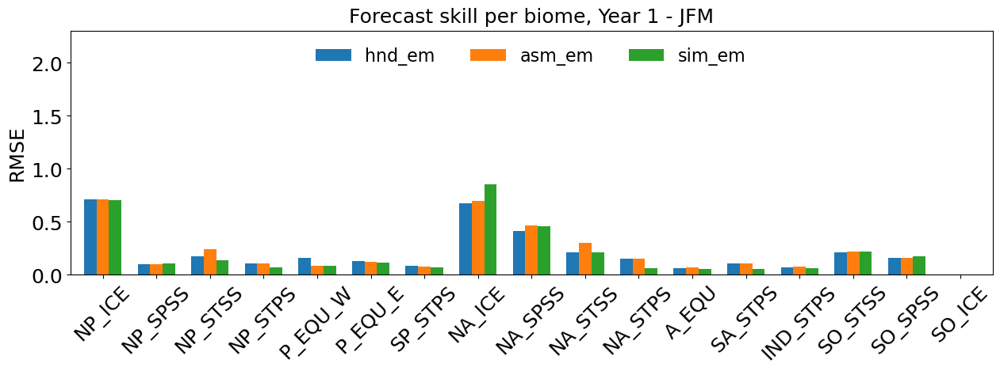

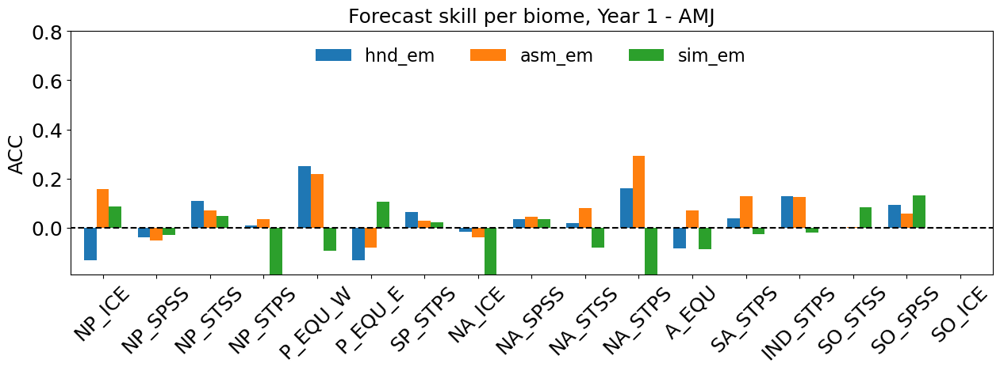

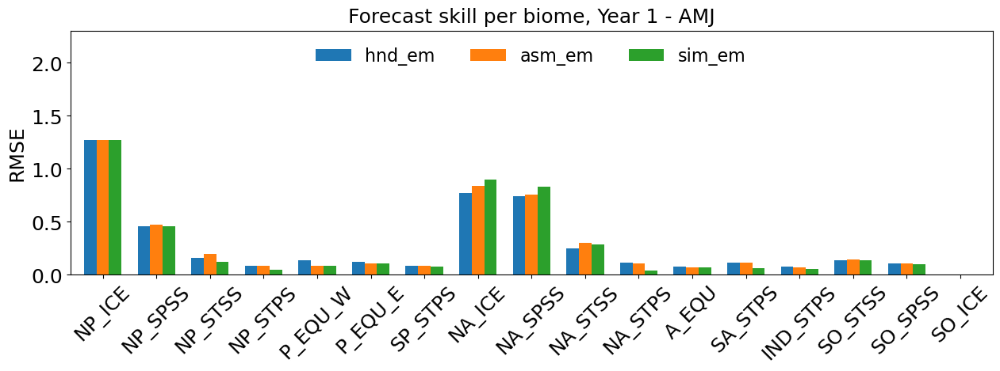

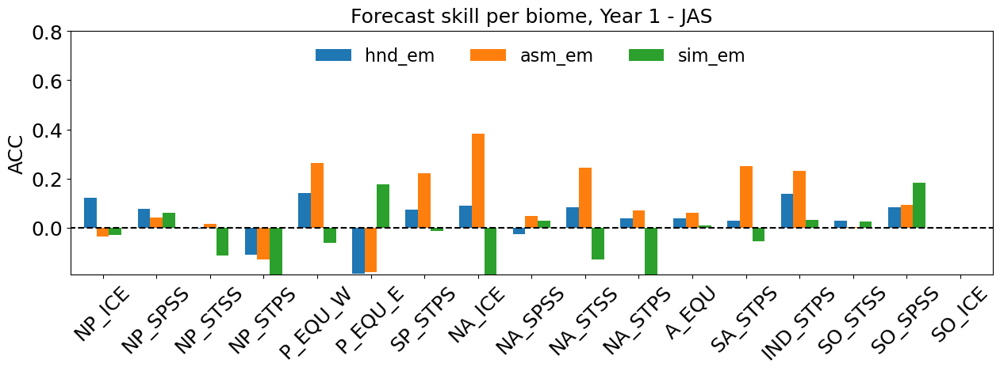

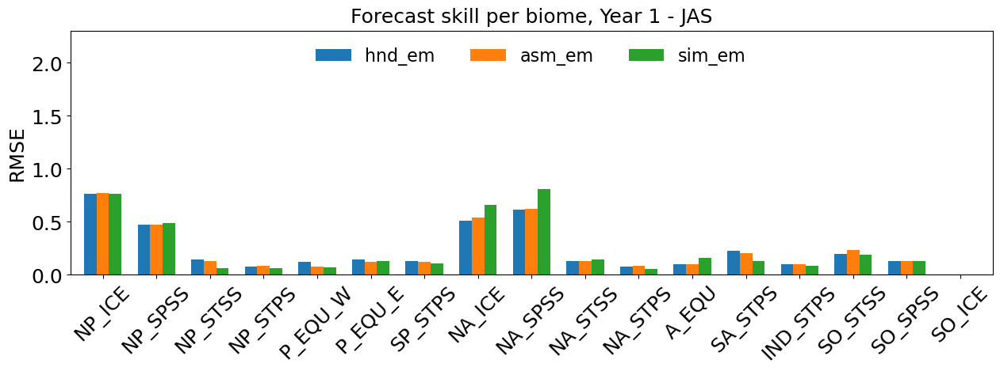

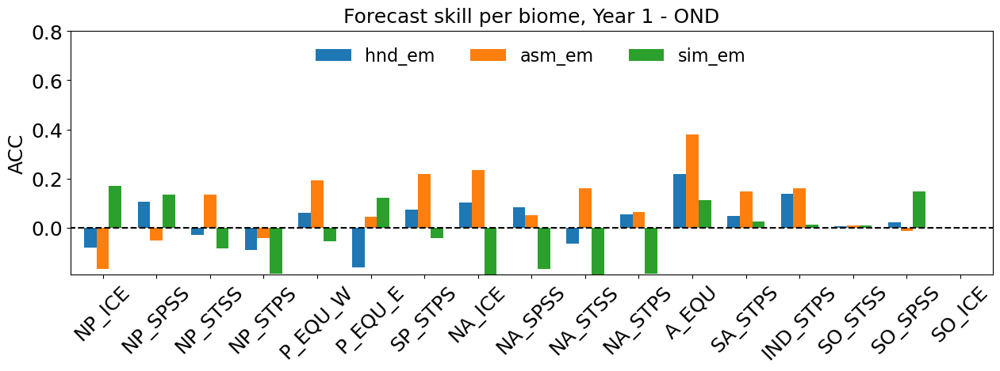

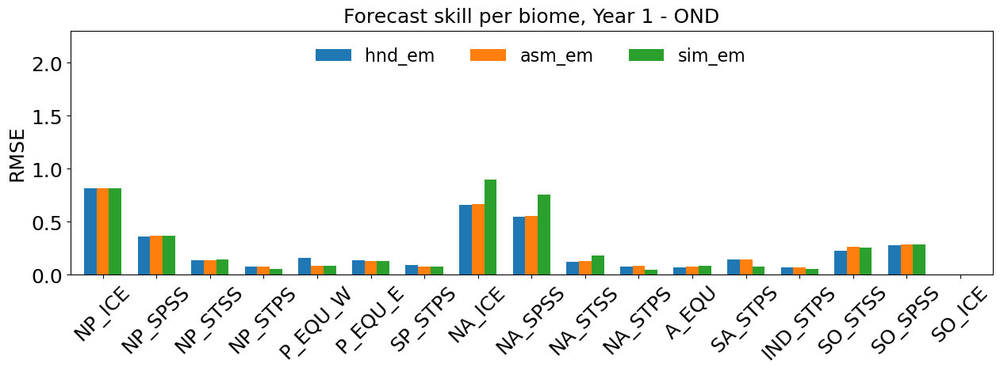

In [216]:
ds_list = [
            'hnd_em',
            'asm_em',
            'sim_em'
          ]

ds_type = 'full'
nld = 1
for season in ['JFM','AMJ','JAS', 'OND']:
    for meas in [
                'corr',
                'rmse'
                ]:

        dict_data_to_plot = {}
        for ild in np.arange(nld):
            dict_data_to_plot[ild] = {}
            for ds in ds_list:
                dict_data_to_plot[ild][ds] = {}
                for bm_label in bms_labels:
                    dict_data_to_plot[ild][ds][bm_label] = {}
                    dict_data_to_plot[ild][ds][bm_label] = dict_meas_biomes_seasons[season][bm_label][ds_type][meas][ds][ild]

        for ild in np.arange(nld):
            
            # file_out = f'Barplots_biomes_{meas}_year-{ild+1}_{nadj_name}'
            plot_bars(dict_data_to_plot[ild],
                    title=f'Forecast skill per biome, Year {ild+1} - {season}',
                    ylabel=dict_plot_meas[meas]['ylabel'],
                    ylim=(dict_plot_meas[meas]['ylim_min'],
                            dict_plot_meas[meas]['ylim_max']),
                    show_hline=dict_plot_meas[meas]['show_hline'],
                    ncol=3,
                    figsize=(15, 4),
                    leg=True,
                    dir_name=dir_out,
                    #   file_name=file_out,
                    show=True,
                    save=False)            

In [233]:
ds_list = [
           'obs',
            'hnd_em',
            'asm_em',
            'sim_em'
          ]

dict_meas_seasons = {}
for season in ['JFM', 'AMJ', 'JAS', 'OND', 'ANN']:
    dict_meas = {}
    for ds_type in ['full']:
        
        dict_meas[ds_type] = {} 

        for ds_meas in ['corr','rmse']:
            
            dict_meas[ds_type][ds_meas] = {} 
                
            for ds in ds_list:
                
                dict_meas[ds_type][ds_meas][ds] = {} 
        
                values = area_weighted_avg(dict_am_measures_seasons[season][ds][ds_type][ds_meas],
                                            mask=mask_ocean).values
                
                dict_meas[ds_type][ds_meas][ds] = values
    dict_meas_seasons[season] = dict_meas

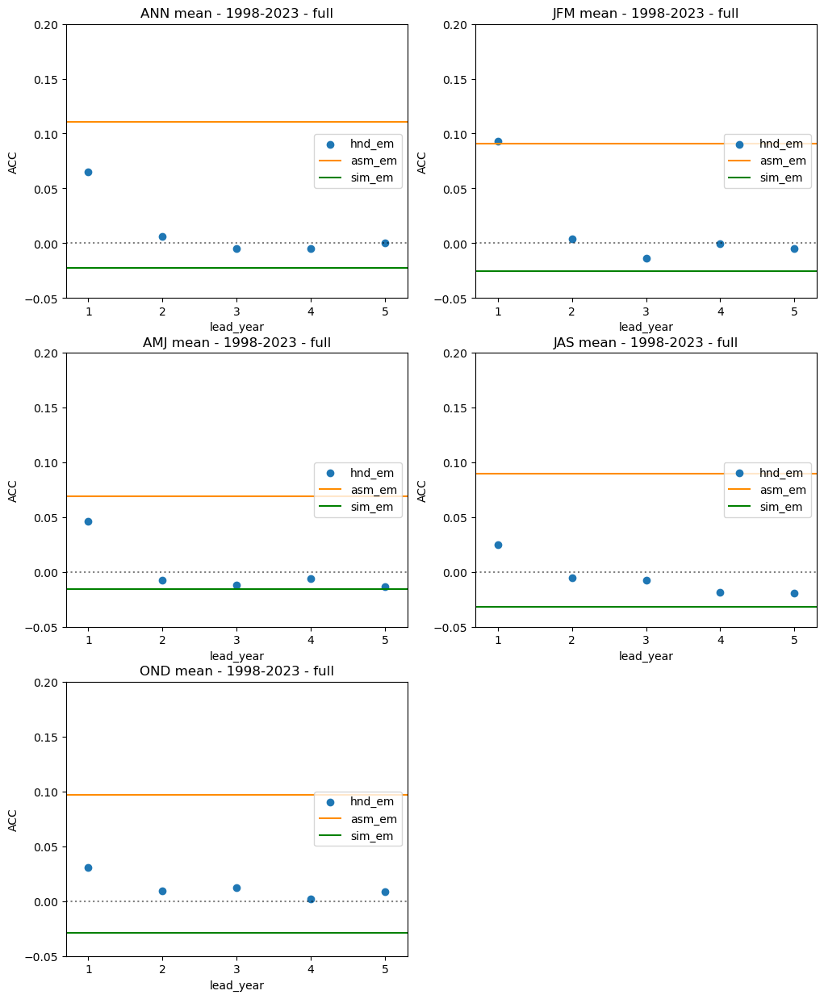

In [265]:
meas = 'corr'
ds_type = 'full'

 
plt.figure(figsize = (12,15))

for ind, season in enumerate(['ANN', 'JFM','AMJ','JAS', 'OND']):
   
        plt.subplot(3,2,ind + 1)
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['hnd_em']
        plt.scatter(np.arange(5), ds_to_plot, label = 'hnd_em')
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['asm_em']
        plt.hlines(ds_to_plot[0],-0.3, 4.3, color = 'darkorange', label = 'asm_em')  
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['sim_em']
        plt.hlines(ds_to_plot[0],-0.3, 4.3, color = 'green',  label = 'sim_em')
        plt.hlines(0,-0.3, 4.3, color = 'k',linestyle = 'dotted', alpha = 0.5)   
        plt.xlabel('lead_year')
        plt.ylabel('ACC')
        plt.title(f'{season} mean - {y0_show}-{y1_show} - {ds_type}')
        plt.ylim([-0.05, 0.2])
        
        plt.xlim([-0.3, 4.3])
        plt.xticks(np.arange(5), np.arange(1,6))
        plt.legend( loc='center right')
  

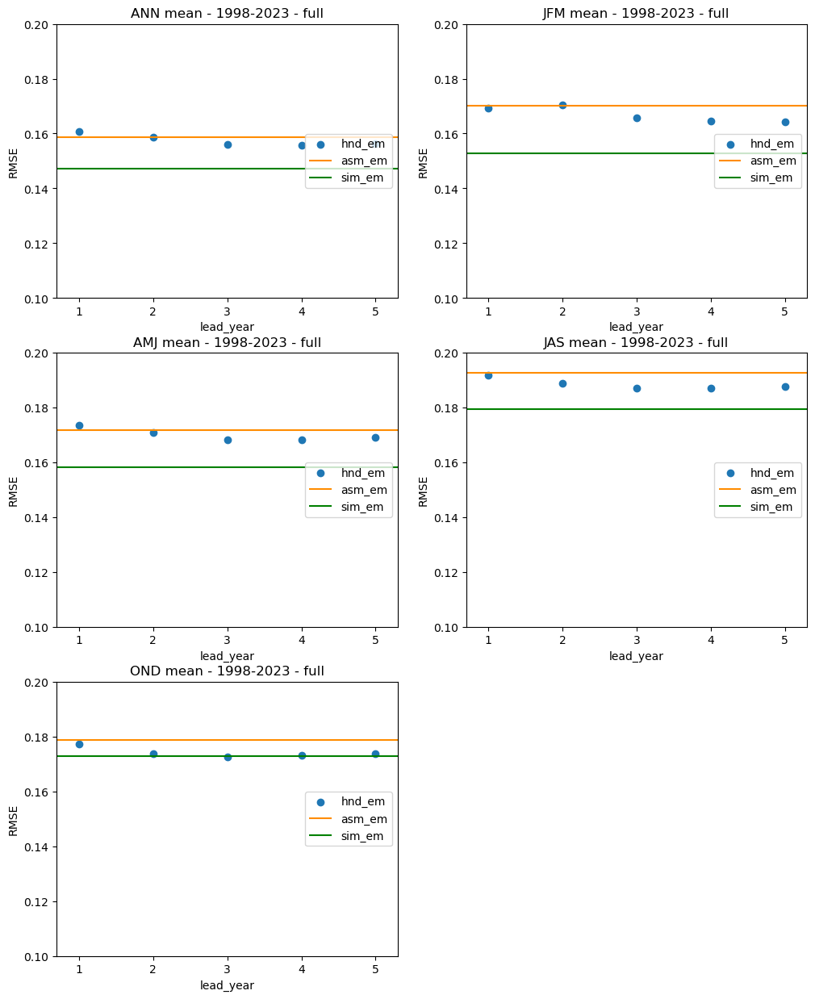

In [267]:
meas = 'rmse'
ds_type = 'full'

ds_list = [
           'obs',
            'hnd_em',
            'asm_em',
            'sim_em'
          ]
 
plt.figure(figsize = (12,15))

for ind, season in enumerate(['ANN', 'JFM','AMJ','JAS', 'OND']):
   
        plt.subplot(3,2,ind + 1)
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['hnd_em']
        plt.scatter(np.arange(5), ds_to_plot, label = 'hnd_em')
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['asm_em']
        plt.hlines(ds_to_plot[0],-0.3, 4.3, color = 'darkorange', label = 'asm_em')  
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['sim_em']
        plt.hlines(ds_to_plot[0],-0.3, 4.3, color = 'green',  label = 'sim_em')
        plt.xlabel('lead_year')
        plt.ylabel('RMSE')
        plt.title(f'{season} mean - {y0_show}-{y1_show} - {ds_type}')
        plt.ylim([0.1, 0.2])
        plt.xlim([-0.3, 4.3])
        plt.xticks(np.arange(5), np.arange(1,6))
        plt.legend( loc='center right')
  

In [267]:
def plot_lead_time_skill(data_dict,
                         bms_labels,
                         ds_list,
                         meas = 'corr',
                         fig_size = (12,6),
                        ylim=(-.5,1),
                        fontsize=18,
                        bbox=(0,0.75,.5,.5),
                         save = False,
                        dir_name=None,
                        file_name=None):
    
    color = {'asm_em' : 'darkorange','sim_em' : 'green'}

    plt.figure(figsize=(12,6))
    for i in range(len(bms_labels)):
        legend_elements = []
        for ds in ds_list: 
            if ds in [  'asm_em','sim_em']:
                ds_plot = dict_data_to_plot[meas][ds].sel(lead_year = slice(1,1))  
                plt.scatter(i * np.ones(len(ds_plot.lead_year)) + 0.15, ds_plot.isel(biome = i), c = color[ds])
                if i==0:
                    legend_elements.append( Line2D([0], [0], marker='o', color=color[ds], label=ds,markerfacecolor=color[ds]))

            else:
                ds_plot = dict_data_to_plot[meas][ds]
                plt.scatter(i * np.ones(len(ds_plot.lead_year)) - 0.15, ds_plot.isel(biome = i), c = ds_plot.lead_year,edgecolors= 'k' , cmap = 'Blues_r')
                if i==0:
                    cbar = plt.colorbar()
                    cbar.set_label('lead_year', fontsize = fontsize)
                    cbar.set_ticks( np.arange(1, len(ds_plot.lead_year) + 1 ).astype('int') , fontsize = fontsize - 2)
            if i == 0:
                plt.legend(handles=legend_elements, loc='best',
                        bbox_to_anchor=bbox,
                      fontsize=fontsize-2)  
            plt.vlines(i + 0.55, ylim[0],ylim[1], linestyles='dashed', color = 'k')

    plt.xticks(np.arange(len(bms_labels)), bms_labels, rotation = 45, fontsize = fontsize - 5)
    plt.ylabel(meas, fontsize = fontsize)
    plt.yticks(fontsize = fontsize - 2)
    plt.xlabel('Biomes', fontsize = fontsize - 2)

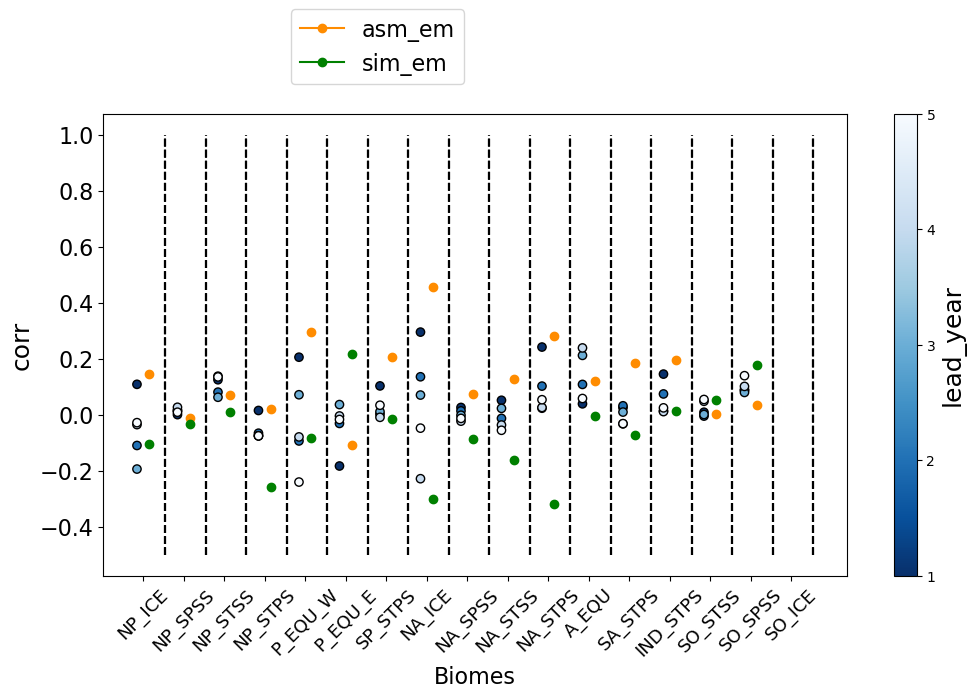

In [268]:
from matplotlib.lines import Line2D
ds_list = [
            'hnd_em',
            'asm_em',
            'sim_em'
          ]

ds_type = 'full'
nld = 5


dict_data_to_plot = {}
for meas in [
             'corr',
             'rmse'
            ]:

    dict_data_to_plot[meas] = {}
    for ds in ds_list:
        dict_data_to_plot[meas][ds] = xr.concat( [xr.DataArray(dict_meas_biomes[bm][ds_type][meas][ds][None,], dims = ['biome' , 'lead_year'], coords = {'lead_year' : np.arange(1,nld+1), 'biome' : [bm]}) for bm in bms_labels],dim = 'biome')

meas = 'corr'
plot_lead_time_skill(dict_data_to_plot, bms_labels, ds_list, meas  = meas)


# ENSO maps

In [ ]:
years = [1998, 2015,2016,2023]
ldyr_ini=1-1
ldyr_end=2-1

dict_to_show = { 
                    'obs'    : dict_anom['obs'].sel(year=slice(y0_show,
                                                               y1_show)),
                    'asm_em' : dict_anom['asm_em'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'hnd_em' : dict_anom['hnd_em'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'sim_em' : dict_anom['sim_em'].sel(year=slice(y0_show,
                                                                  y1_show))
               }

for year in years:

    plot_composites([
                                    'obs',
                                    'asm_em',
                                    'hnd_em',
                                    'sim_em'
                    ],
                    dict_to_show,     
                    figsize=(18,12),   
                    specific_years = [year] ,       
                    central_longitude=0,
                    ldyr_ini=ldyr_ini,
                    ldyr_end=ldyr_end,
                    vmax=0.1,
                    vmin=-0.1,
                    dir_name=dir_out,
                    file_name=file_out,
                    save=False,
                    mask = mask_ocean,
                    cbar_label = units)